In [1]:

# ---
import pandas as pd
import numpy as np
import os
import seaborn as sns
# ---
# Para visualização
# ---
import matplotlib.pyplot as plt
# ---
%matplotlib inline
%config InlineBackend.figure_format='svg'

#### No Colab

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
link='/content/drive/MyDrive/python/You_tube_database/archive/'

In [4]:
from googleapiclient.discovery import build
#credential from my project cinco

youTubeApiKey_quatro='Coloque aqui sua chave'
youtube_quatro=build('youtube','v3',developerKey=youTubeApiKey_quatro)


#### NO Jupyter Lab

In [2]:
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'



#### Continue aqui

Carregando a base de dados de amostras, ouseja, todos os vídeos que coletamos em 30 dias

In [3]:
dados_original=pd.read_csv(link+'amostra_de_videos.csv')


/tmp/ipykernel_24723/1664115370.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  dados_original=pd.read_csv(link+'amostra_de_videos.csv')


In [4]:
dados=dados_original.copy()
dados=dados.drop(columns='Unnamed: 0')
dados.shape

(148138, 14)

In [5]:
dados=dados.rename(columns={'id':'Id'})


In [6]:
dados.tail(2)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo
148136,qxuCW6ixfJw,122041.0,1842.0,330.0,UCIu9zJq00ev2xj37kvyHtZQ,2022-09-18T22:36:57Z,NaN,2015-02-03T19:23:32Z,Beyaz Futbol,TR,305873491,504000.0,4063,Beyaz Futbol 18 Eylül 2022 2.Kısım ( Fenerbahç...
148137,OT4GbT1x8Js,8848.0,278.0,1.0,UC48h7Dst_hX82HxOf3xJw_w,2022-09-19T02:00:06Z,NaN,2014-05-29T07:24:43Z,Ch3Thailand,TH,20740290137,32000000.0,75441,ข้าไม่ใช่บัวผัน และท่านก็ไม่ใช่แสนเมือง #ภูตแม...


Vejamos quantos vídeos diferentes trouxe o experimento de requisição para a API YouTube V3,


In [7]:
len(dados['Id'].unique())

31164

Vemos então que a quantidade de vídeos diferentes  não é tão grande quanto esperado, isto pode suceder em razão do vies dos critérios de procura da API, a qual deixa de priorizar o filtro after para priorizar popularidade.

In [8]:
dados.iloc[4800:5000]

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo
4800,fupSnl95668,17729.0,94.0,5.0,UCuJ5k3GndbHnXLYyiIR6Z8Q,2022-08-18T09:00:32Z,Gái già xì tin tập 2 | Gái ế 30 cắt duyên âm x...,2018-12-20T07:33:59Z,VTV Giải Trí Official,VN,2178060384,2530000.0,9371,NaN
4801,Cp5sQ_n7QuI,3677.0,666.0,96.0,UCbyjYRUS9gADwAGuUxcfVcA,2022-08-18T14:33:55Z,The Easy One Pan Weeknight Pasta That&#39;s Im...,2018-11-27T20:05:14Z,Sip and Feast,US,26411543,407000.0,196,NaN
4802,pGlz23vtXoQ,12210.0,208.0,67.0,UC_gUM8rL-Lrg6O3adPW9K1g,2022-08-18T09:15:21Z,First Russian military drills since Ukraine wa...,2016-05-19T12:55:08Z,WION,IN,3074923124,6690000.0,80560,NaN
4803,-LxYz_mnY8I,7312.0,198.0,19.0,UCF1JIbMUs6uqoZEY1Haw0GQ,2022-08-18T10:11:33Z,Itti Si Khushi - इत्ती सी ख़ुशी - Episode 01 - ...,2007-09-01T11:44:51Z,Shemaroo,IN,20622368434,40000000.0,9807,NaN
4804,AWxN3nB3KY8,4877.0,292.0,58.0,UC5RwNJQSINkzIazWaM-lM3Q,2022-08-18T12:12:28Z,Tracy Morgan Turns UP &amp; Shares &#39;SNL&#3...,2006-09-19T15:55:00Z,HOT 97,US,1596829462,3640000.0,8984,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,D_nVKLjRNto,13572.0,393.0,23.0,UCF12AuT-beSk-61H8sxA0vw,2022-08-19T08:00:06Z,Dragon Ash/100 interviewers Q10,2009-01-26T08:51:28Z,Dragon Ash,JP,61259951,156000.0,129,NaN
4996,2n3fzYYHXWs,29634.0,1710.0,71.0,UCw5-xj3AKqEizC7MvHaIPqA,2022-08-18T18:41:30Z,FACINCANI NÃO SE SEGURA COM JORGINHO: &#39;NUL...,2012-01-04T20:13:45Z,ESPN Brasil,BR,1953071088,4310000.0,20778,NaN
4997,8N7bgWqUqZU,534.0,48.0,2.0,UCwuBNS7gH0rguuRj80VTeEw,2022-08-19T03:00:05Z,Jad &amp; Jefferson - Só Pra Vida Inteira - Si...,2011-06-15T13:20:55Z,Atração Divulga,BR,1160421921,2410000.0,10946,NaN
4998,LMxvLkAIkCA,916.0,165.0,11.0,UCK_SdSZZWzrSHHrVjcCzPcg,2022-08-18T22:30:09Z,TOP Brincadeiras Folclóricas pra fazer o ano t...,2015-09-11T03:23:06Z,Professora Coruja,BR,7712078,227000.0,327,NaN


Vejamos um histograma da distribuição dos likes para os videos amostrados

<AxesSubplot:>

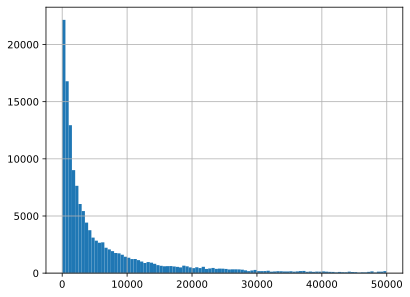

In [9]:
dados[dados['likes']<50000]['likes'].hist(bins=100)

In [10]:
dados_tendencias=pd.read_csv(link+'tendencias_tratadas.csv',lineterminator='\n')

In [11]:
dados_tendencias.shape

(150061, 17)

In [12]:
dados_tendencias.tail(5)

,Unnamed: 0,Id,Titulo,Data,C_id,C_titulo,Categoria,Data_tendencia,Etiqueta,Vistas,likes,dislikes,Q_comentarios,Descricao,Duracao,C_Data,Subscriptores
150056,154586,Se6bs4QFtPE,DESCOBRINDO MINHA 2º GRAVIDEZ 🥹| REAÇÕES DE F...,2022-09-11 15:15:39+00:00,UCAvlPcTn6KYxjnAV0vXalFQ,Dani Mendes,People & Blogs,2022-09-19 00:00:00+00:00,GRAVIDINHA EM ACAO|CANSEI 3 DIAS SEM ARRUMAR C...,223110,29333,0,1968,► Vamos ficar mais pertinho? Nos sigam no Inst...,1586.0,2012-01-24 22:32:18+00:00,474000.0
150057,154587,ciIcEYyBkDU,PASSAMOS A NOITE NOS LUGARES MAIS ALEATÓRIOS D...,2022-09-11 21:00:15+00:00,UC6paX0kLA8D81aYogceMufw,Rafa & Luiz,Entertainment,2022-09-19 00:00:00+00:00,rafaella|baltar|luiz|phellipe|K.FUN|passamos|n...,979128,46726,0,1647,Aumentamos a dificuldade do desafio e queremos...,1598.0,2015-08-26 14:27:32+00:00,17600000.0
150058,154588,JkaKW44GncA,BATERAM NO NOSSO VOLVO NL12! - Corujinha Vlog,2022-09-11 18:22:56+00:00,UCq88JUfvzjK1bheVJQJPAnQ,Corujinha Vlog,Autos & Vehicles,2022-09-19 00:00:00+00:00,[None],103850,13446,0,366,● Contato para parcerias: corujinhatransporte@...,649.0,2009-12-24 20:41:34+00:00,494000.0
150059,154589,TUtpUoletXQ,KATERINI GANHOU MUITA COISA!!!!,2022-09-11 22:06:46+00:00,UCk-X1li7YXeIdrqZSTT-x4g,Dora Rodrigues,People & Blogs,2022-09-19 00:00:00+00:00,Dora Rodrigues|maternidade|maternity|bebê|baby...,149178,19189,0,529,QUER PRESENTEAR A KATERINI 👇🏽https://www.amazo...,1788.0,2014-03-07 19:56:22+00:00,307000.0
150060,154590,1MCZM4PP5J4,Race Highlights | 2022 Italian Grand Prix,2022-09-11 15:38:18+00:00,UCB_qr75-ydFVKSF9Dmo6izg,FORMULA 1,Sports,2022-09-19 00:00:00+00:00,F1|Formula One|Formula 1|Sports|Sport|Action|G...,5370501,105532,0,6551,The Temple of Speed always provides us with br...,427.0,2005-12-29 00:34:38+00:00,8280000.0


In [13]:
b=list(dados_tendencias['Id'])
a=list(dados['Id'])
# d=list(dados_sem['video_id'])

O seguinte comando, faz uma interseção de conjuntos, um conjunto no python somente considera elementos diferentes.

In [ ]:

c=set(a).intersection(b)

Vejamos quantos vídeos foram perdidos depois da limpeza de dados

In [ ]:
len(c)

355

In [ ]:
type(c)

set

Se imprimimos o conjunto c, teriamos a notação de colchetes, cinvertindo este conjunto em uma lista nos obtemos

In [ ]:
intesection=list(c)

Vejamos agora, onde aparecem estes videos nas respetivas bases de dados.

### Ideia para sselecionar 

Vamos usar algum algoritmo de agrupamento, baseado em distancia, sobre os dados amostrados com a finalidade de escolher vídeos que mesmos sendo similares com vídeos que viraram tendência não chegaram a estar presentes nas listas.

A ideia de este algoritmo é:

- Seleccionar videos similares a vídeos que posteriormente chegaram a ser tendência.

- Escolher esses vídeos de modo a que constituam futuras censuras a direita.


In [ ]:
dados_inter=dados_tendencias.loc[dados_tendencias['Id'].isin(intesection)]

In [ ]:
dados_inter.shape

(2145, 17)

Vemos também que os vídeos vieram reperidos nas listas de amostras

### Profiling

In [ ]:
import pandas_profiling

In [ ]:
pandas_profiling.ProfileReport(dados_inter)



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Continue aquí (Seleção de amostra)

In [28]:
ima='/home/brayan/Dropbox/Latex/MBA/TCC/USPSC-v2.1/USPSC-img/'
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'


dados_tendencias=pd.read_csv(link+'tendencias_tratadas.csv',lineterminator='\n')
dados=pd.read_csv(link+'amostra_de_videos.csv')
dados=dados.drop(columns='Unnamed: 0')
dados=dados.rename(columns={'id':'Id'})
b=list(dados_tendencias['Id'])
a=list(dados['Id'])
# d=list(dados_sem['video_id'])

c=set(a).intersection(b)

/tmp/ipykernel_125536/1702052838.py:6: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  dados=pd.read_csv(link+'amostra_de_videos.csv')


In [39]:
dados_inter_amostra=dados.loc[dados['Id'].isin(list(c))]
dados_inter=dados_tendencias.loc[dados_tendencias['Id'].isin(list(c))]
print(dados_inter_amostra.shape,len(dados_inter_amostra['Id'].unique()))
print(dados_inter.shape,len(dados_inter['Id'].unique()))

(2314, 14) 355
(2145, 17) 355


In [40]:
import seaborn as sns
#%matplotlib inline
# a=dados_inter_amostra['Id'].value_counts().values # Padrão em amostras
# a=dados_inter['Id'].value_counts().values # Padrão em tendências
# sns.histplot(data=a,binwidth=1)
#x='Dias como tendência',y='Quantidade de videos'

Vamos seleccionar uma amostra de 355 vídeos similares com os vídeos que foram coletados usando o API para posteriormente virar tendência, usamos uma medidade o crescimento a distancia entre curvas de crescimento de quantidade de vistas

In [41]:
import seaborn as sns
#%matplotlib inline
# a=dados['Id'].value_counts().values

# sns.histplot(data=a,binwidth=1)

Nossa primeira seleção vai ser baseada únicamente na quantidade de visualizações obtidas no momento de requisição.

Por cada elemento das 355 premturas tendências vamos escolher um elemento:

- com a quantidade de visullizações mais parecida,
- Que não foi tendencia,
- Que não é o elemento mais próximo de outra tenência prematura.



Primeramente eliminamos as repetições da base de amostras e conservamos unicamente as primeiras ocorrecias:

In [42]:
amostras_primeira=dados.drop_duplicates(subset='Id',keep='first')
amostras_primeira.shape

(31164, 14)

Agora eliminamos os ids que são videos posteriormete tendências

In [44]:
amostras_sem_ten=amostras_primeira[~amostras_primeira['Id'].isin(list(c))]

In [45]:
amostras_sem_ten.shape

(30809, 14)

In [46]:
intesection=list(c)
amostras_com_ten=amostras_primeira[amostras_primeira['Id'].isin(intesection)]
amostras_com_ten.shape

(355, 14)

De estes 30809 registros diferentes que foram requisitados pela API vamos selecionar 355, um por cada prematura tendência, o criterio de proximidade será a distância entre o número de vistas entre os vídeos 

Vejamos como esta conta fica para um video

In [47]:
intesection[0]

'CPklhptCLP8'

In [48]:
amostras_com_ten.head(2)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo
673,sJHYNATW_C4,5493.0,5450.0,1372.0,UClPOJqFbYMKGyM2Nqst0NxA,2022-08-18T15:00:28Z,Joelma - ISSO É CALYPSO AO VIVO NA AMAZÔNIA - ...,2016-01-16T15:44:05Z,Joelma Oficial,BR,267513600,1290000.0,113,NaN
4890,E1FNkf3MLKY,398599.0,54774.0,4017.0,UCEuOwB9vSL1oPKGNdONB4ig,2022-08-19T04:00:08Z,Red Hot Chili Peppers - Tippa My Tongue (Offic...,2007-02-06T02:06:34Z,Red Hot Chili Peppers,US,6264996261,7030000.0,161,NaN


In [49]:
# amostras_com_ten=amostras_com_ten.set_index('Id')

In [51]:
amostras_com_ten.loc[amostras_com_ten['Id']=='CPklhptCLP8']

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo
74059,CPklhptCLP8,341187.0,41839.0,487.0,UCFjrDmEnxrG5TRGVO0TPHLA,2022-09-01T21:54:23Z,NaN,2013-06-12T17:35:28Z,Desimpedidos,BR,2449414871,9210000.0,3100,SUPERTRUNFO COM FIGURINHAS DA COPA


1

In [55]:
d=amostras_com_ten.loc[amostras_com_ten['Id']=='sJHYNATW_C4'].to_dict(orient='index')
d

{673: {'Id': 'sJHYNATW_C4',
  'Vistas': 5493.0,
  'likes': 5450.0,
  'Comentarios': 1372.0,
  'C_id': 'UClPOJqFbYMKGyM2Nqst0NxA',
  'Data': '2022-08-18T15:00:28Z',
  'Título': 'Joelma - ISSO É CALYPSO AO VIVO NA AMAZÔNIA - REI DA FESTA',
  'C_Data': '2016-01-16T15:44:05Z',
  'C_Titulo': 'Joelma Oficial',
  'Pais': 'BR',
  'C_Vistas': 267513600,
  'Subscriptores': 1290000.0,
  'No Videos': 113,
  'Titulo': nan}}

In [ ]:
list(d.keys())[0]

673

In [ ]:
d[list(d.keys())[0]]['Vistas']

5493.0

Para cada um dos vídeos na lista dos no tend^Çencia queremos comparar a diferencia entre os likes

In [56]:
def distancia(a,b):
    return(np.abs(a-b))

Para ordenaro os indices de modo a ter um argumento posscional

In [57]:
amostras_sem_ten.reset_index(drop=True,inplace=True)

In [58]:
amostras_sem_ten.sample(2)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo
3399,0TuzZ7GEW2w,30072.0,6542.0,300.0,UCkIEY6rUSPy4qQjLqBBLUSg,2022-08-21T15:16:51Z,Esse vídeo é sobre meu dia,2016-07-14T18:36:36Z,Via Infinda,NaN,157674558,1680000.0,414,NaN
4753,QTS9w_e0x-Y,324.0,7.0,0.0,UC3PLuDHi99dZPEeqC6q3Etw,2022-08-21T17:49:34Z,8.21.2022 慕迪港頌恩堂粵語崇拜｜講題：最愛是誰？,2020-03-10T21:04:16.334464Z,Port Moody Pacific Grace Church 慕迪港頌恩堂,CA,80689,429.0,437,NaN


In [59]:
d_sem=amostras_sem_ten['Vistas'].to_dict()
# d_sem

In [97]:
d_dif={}

for i in range(len(amostras_sem_ten)):
    d_dif[i]=distancia(5493,d_sem[i])

d_dif é um diccionario que armasena a distancia até o video o vídeo tendência de cada um dos 30809 vídeos

In [67]:
list(d_dif.items())[:10]

[(0, 9147.0),
 (1, 41223.0),
 (2, 8312.0),
 (3, 364.0),
 (4, 18134.0),
 (5, 25609.0),
 (6, 63661.0),
 (7, 1467532.0),
 (8, 318747.0),
 (9, 24350.0)]

In [72]:
distances={k: v for k, v in sorted(d_dif.items(), key=lambda item: item[1])}
print(list(distances.items())[:20])

# obtendo a chave e a distancia do elemento mais próximo

print(min(d_dif, key=d_dif.get),d_dif[min(d_dif, key=d_dif.get)])



[(7627, 0.0), (9129, 0.0), (10183, 0.0), (13066, 0.0), (2823, 1.0), (11031, 1.0), (582, 2.0), (9530, 2.0), (9562, 2.0), (15400, 2.0), (20269, 2.0), (22120, 9.0), (16720, 11.0), (20200, 11.0), (20473, 11.0), (18334, 12.0), (16061, 14.0), (16241, 14.0), (16408, 15.0), (16410, 15.0)]
7627 0.0


Criandfo um datafram e agregando a tendÊncia prematura e seu semelhante

In [73]:
d_agre=amostras_sem_ten.iloc[min(d_dif, key=d_dif.get)].to_dict()
d_agre

{'Id': 'YuRNJMU7dyY',
 'Vistas': 5493.0,
 'likes': 940.0,
 'Comentarios': 262.0,
 'C_id': 'UC7DDcxd92wR0LzlMKIcHDAA',
 'Data': '2022-08-25T16:37:22Z',
 'Título': 'İbrahim Tatlıses trafik kazası geçirdi!',
 'C_Data': '2014-08-12T14:14:43Z',
 'C_Titulo': 'Show Ana Haber',
 'Pais': 'TR',
 'C_Vistas': 4528750594,
 'Subscriptores': 2330000.0,
 'No Videos': 51091,
 'Titulo': nan}

Criamos um dataframe vazio e adicionamos sua primeira fila com o vídeo mais próximo à primeira tendência


In [90]:
df=pd.DataFrame(columns = ['Id', 'Vistas', 'likes','Comentarios','C_id','Data','Título','C_Título','C_data','País','C_vistas','Subscriptores','No Videos','Titulo'],index = range(710))
# df

In [91]:
df.iloc[0]=list(d_agre.values())
# df

Agora agregando a tendencia prematura

In [92]:
d_agre2=amostras_com_ten.loc[amostras_com_ten['Id']=='sJHYNATW_C4'].to_dict(orient='index')
# d_agre2

In [93]:
# d_agre2[673]

In [98]:
df.iloc[1]=list(d_agre2[673].values())
len(d_dif)

30809

Eliminamos no diccionario que contem todas as distâncias, a chave do elemento mais próximo, da primeira tendência que consideramos

In [99]:
d_dif.pop(min(d_dif, key=d_dif.get))
len(d_dif)

30808

### Agora se repetiria o processo para a seguinte chave na lista interseções.

Primeiro os elemtos ue vamos preencher

In [107]:
amostras_sem_ten=amostras_primeira[~amostras_primeira['Id'].isin(intesection)]
amostras_com_ten=amostras_primeira[amostras_primeira['Id'].isin(intesection)]



In [108]:
amostras_sem_ten=amostras_sem_ten[amostras_sem_ten['Pais'].isin(['BR','US'])]
amostras_sem_ten.shape

(12804, 14)

In [109]:
amostras_sem_ten['Pais'].value_counts()

BR    9671
US    3133
Name: Pais, dtype: int64

In [110]:
amostras_sem_ten.reset_index(drop=True,inplace=True)

d_sem=amostras_sem_ten['Vistas'].to_dict()
# d_sem

In [111]:

df=pd.DataFrame(columns = ['Id', 'Vistas', 'likes','Comentarios','C_id','Data','Título','C_Título','C_data','País','C_vistas','Subscriptores','No Videos','Titulo'],index = range(710))


In [112]:
i=0
for video in intesection:
    d={}# dicionario para video tendencia
    d_agre={} # Dicionario para video mais róximo a tendencia
    d=amostras_com_ten.loc[amostras_com_ten['Id']==video].to_dict(orient='index')
    # dados do video tendencia
    d_dif={}# dicionario de distancias
    key=list(d.keys())[0]#chave do video tendecia
    v=d[key]['Vistas']# quantidade de vistas do video tendencia 

    for j in range(len(amostras_sem_ten)):
        d_dif[j]=distancia(v,d_sem[j])
    
    
    d_agre=amostras_sem_ten.iloc[min(d_dif, key=d_dif.get)].to_dict()
    #pegue os dados do video que não é tendencia e que é mais próximo em vistas do 
    #video que s é tendência
    df.iloc[i]=list(d_agre.values())
    #agrefue uma linha  com o vídeo que não é tendência
    df.iloc[i+1]=list(d[key].values())
    #agregue a lista do vídeo que si é tendência
    d_sem[min(d_dif, key=d_dif.get)]=-100000
    i=i+2 # preenchio duas linhas, então pule dois na cntagem
   
    
    
    


In [113]:
len(df['Id'].unique())

710

In [114]:
status=[0,1]*355
# status

In [115]:
df['Status']=status
# df

In [116]:
df['Vistas']=pd.to_numeric(df['Vistas'])
df['likes']=pd.to_numeric(df['likes'])
df['Comentarios']=pd.to_numeric(df['Comentarios'])
df['Subscriptores']=pd.to_numeric(df['Subscriptores'])
df['No Videos']=pd.to_numeric(df['No Videos'])


In [117]:
df['Data']= pd.to_datetime(df['Data'])
# 

In [118]:
df.rename(columns={'C_Título':'C_data','C_data':'C_Título'},inplace=True)

In [119]:
df['C_data']= pd.to_datetime(df['C_data'])

In [120]:
# 
df.dtypes

Id                            object
Vistas                       float64
likes                        float64
Comentarios                  float64
C_id                          object
Data             datetime64[ns, UTC]
Título                        object
C_data           datetime64[ns, UTC]
C_Título                      object
País                          object
C_vistas                      object
Subscriptores                float64
No Videos                      int64
Titulo                        object
Status                         int64
dtype: object

In [121]:
df

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status
0,tNvly41YoWo,340772.0,19602.0,335.0,UC6paX0kLA8D81aYogceMufw,2022-08-19 18:19:49+00:00,FIZEMOS ENALDINHO E ANNINHA TERMINAREM O NAMOR...,2015-08-26 14:27:32+00:00,Rafa & Luiz,BR,6306531950,17100000.0,2205,NaN,0
1,CPklhptCLP8,341187.0,41839.0,487.0,UCFjrDmEnxrG5TRGVO0TPHLA,2022-09-01 21:54:23+00:00,NaN,2013-06-12 17:35:28+00:00,Desimpedidos,BR,2449414871,9210000.0,3100,SUPERTRUNFO COM FIGURINHAS DA COPA,1
2,t0VevG2QCSw,115636.0,16126.0,524.0,UCLJkh3QjHsLtK0LZFd28oGg,2022-08-23 21:01:00+00:00,"Michael Burry vendeu todas suas ações, estaria...",2011-12-13 02:12:32+00:00,Fernando Ulrich,BR,50197094,503000.0,815,NaN,0
3,psmGwWQLdg4,115619.0,21613.0,746.0,UCEfGV5hx2VrXl4jOUnG0MRQ,2022-08-23 13:00:25+00:00,Eu Comi os Piores Doces do Mundo!,2016-07-22 15:39:07+00:00,Geleia,BR,1954913120,5770000.0,1572,NaN,1
4,6PnnWl1S8mM,332279.0,55588.0,2747.0,UCKHhA5hN2UohhFDfNXB_cvQ,2022-08-30 20:00:09+00:00,NaN,2006-07-24 13:42:36+00:00,Manual do Mundo,BR,3412911111,16600000.0,2141,A BOLA PERFEITA de CALÇA JEANS,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,pvJ3lCd6QwA,213401.0,25899.0,837.0,UCEfGV5hx2VrXl4jOUnG0MRQ,2022-09-01 13:30:10+00:00,NaN,2016-07-22 15:39:07+00:00,Geleia,BR,1979644058,5830000.0,1577,Creative Squad 3: Criei um Bioma Inteiro de Sc...,1
706,LJHfPGuWADY,55626.0,871.0,149.0,UC08mnbiC4FykqpHqbEWgFcg,2022-09-15 15:30:06+00:00,NaN,2019-05-09 14:52:15+00:00,ESPN Deportes,US,1540986552,2550000.0,20802,Las PROBABILIDADES de Chivas ante América en e...,0
707,7-49hazx5LE,55627.0,9671.0,365.0,UCqifkpdmE1z3VhfQoJzwpJQ,2022-09-09 22:21:11+00:00,NaN,2011-08-02 18:15:24+00:00,Cruzeiro Esporte Clube,BR,66492459,508000.0,3985,🦊💙 BASTIDORES | CRUZEIRO 1 X 0 OPERÁRIO | CRUZ...,1
708,8y44uoREk6Y,502264.0,25803.0,613.0,UCs-6sCz2LJm1PrWQN4ErsPw,2022-09-13 19:08:06+00:00,NaN,2009-10-30 00:30:39+00:00,TNT Sports Brasil,BR,2407987955,9190000.0,9982,PINTURA! GOLAÇO COM CANETA E GOLS NOS ACRÉSCIM...,0


### Carregando os dados 

In [ ]:
link

'/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'

In [ ]:
# with open(link+'amostras_selecionadas.csv', 'w') as f:
#   df.to_csv(f)

### Visualização

In [125]:
df.columns

Index(['Id', 'Vistas', 'likes', 'Comentarios', 'C_id', 'Data', 'Título',
       'C_data', 'C_Título', 'País', 'C_vistas', 'Subscriptores', 'No Videos',
       'Titulo', 'Status'],
      dtype='object')

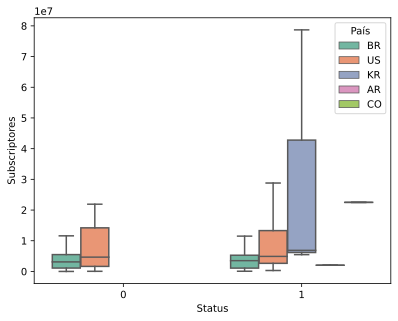

In [127]:
ax = sns.boxplot(x='Status', y='Subscriptores',hue='País', data=df, palette='Set2',showfliers=False)

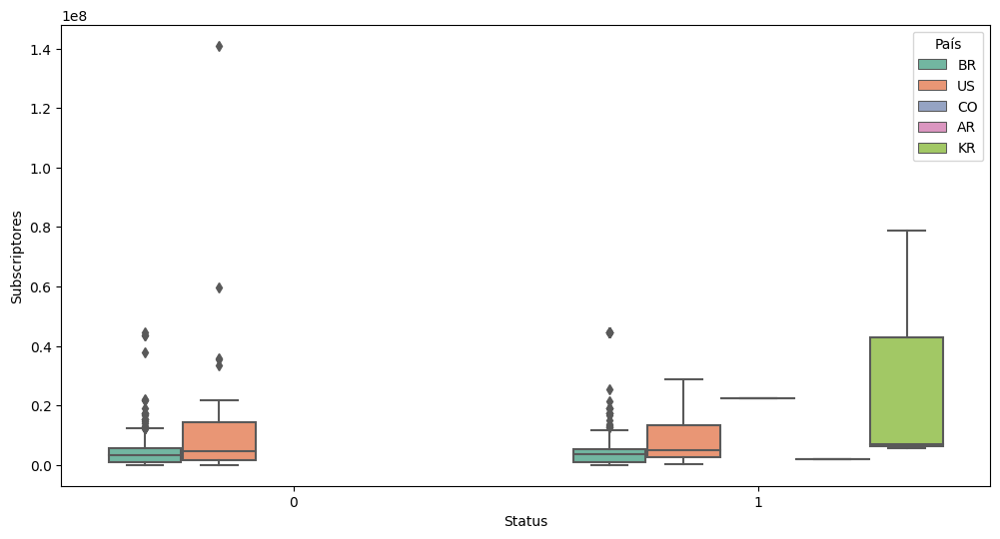

In [ ]:
plt.figure(figsize=(12,6))  
ax = sns.boxplot(x='Status', y='Subscriptores', hue='País',data=df, palette='Set2')

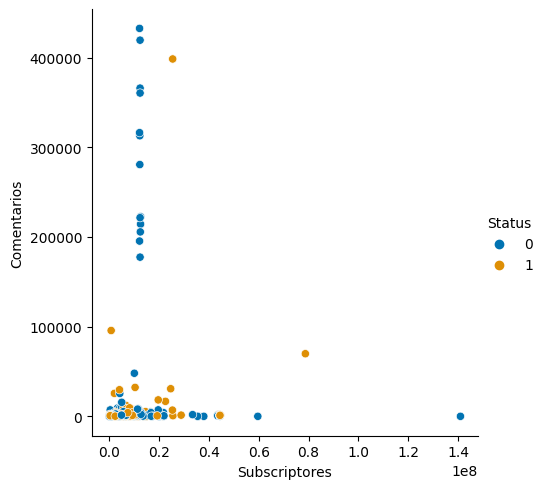

In [ ]:
sns.set_palette('colorblind')
sns.relplot(x='Subscriptores', y='Comentarios',hue='Status', data=df)

Join PLot

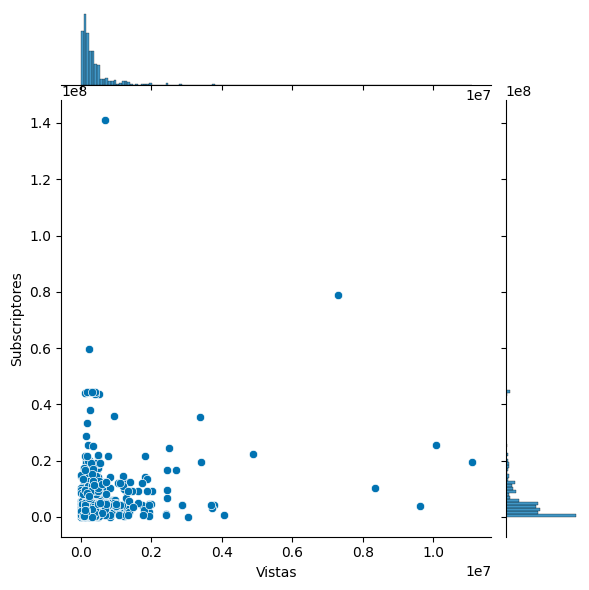

In [ ]:
sns.jointplot(x='Vistas', y='Subscriptores',   data=df);

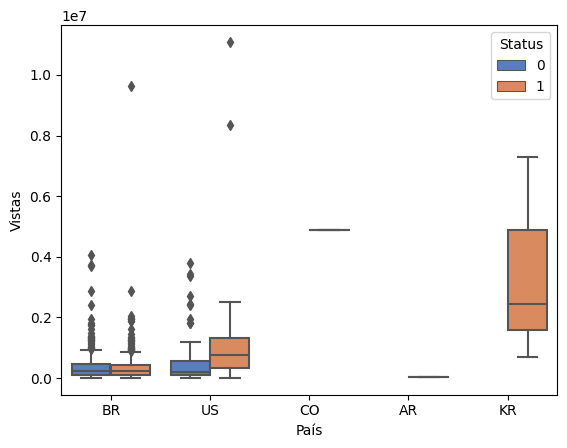

In [ ]:
ax = sns.boxplot(x='País', y='Vistas', hue='Status', data=df, palette='muted')

In [ ]:
df.head(1)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,UC63iwP6BtIjxB6xn1GKR6Lw,2022-09-08 19:45:33+00:00,NaN,2015-01-30 00:13:30+00:00,Emilly Vick,BR,986194410,2880000.0,154,FUI EXPULSA DA LOJA PELO SEGURANÇA *deu muito ...,0


### Carregando os dados

O csv guradado chama-se  amostra selecionadas 

In [ ]:
link='/content/drive/MyDrive/MyCopy/You_tube_database/archive/'

In [ ]:
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'

In [ ]:
import pandas as pd
import numpy as np

df_amostras = pd.read_csv(link+'amostras_selecionadas.csv')

In [ ]:
df_amostras=df_amostras.drop('Unnamed: 0',axis=1)

In [ ]:
df_amostras.head(2)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status,Categoria,Duracao,Data_tendencia
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,UC63iwP6BtIjxB6xn1GKR6Lw,2022-09-08 19:45:33+00:00,NaN,2015-01-30 00:13:30+00:00,Emilly Vick,BR,986194410,2880000.0,154,FUI EXPULSA DA LOJA PELO SEGURANÇA *deu muito ...,0,Science & Technology,27.0,NaN
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,UCiIZY89KwQkxAW-4Le7U7zg,2022-09-13 21:10:17+00:00,NaN,2011-01-18 00:36:12+00:00,viniccius13,BR,872438573,5850000.0,505,A Forja do Golem Gigante - Minecraft Em busca ...,1,Gaming,2104.0,2022-09-15 00:00:00+00:00


### Durations and category

Na seguinte requisssição snnipet contem a categoria e content details contem a duração

In [ ]:
request = youtube_quatro.videos().list(
          part="snippet, contentDetails",
          id='wxvduBB8jPo'
      )
# fileDetails ,, ,suggestions,
response = request.execute()
response

{'kind': 'youtube#videoListResponse',
 'etag': '-WS5wi-Ur7jjFie0g-oxn6g0k1U',
 'items': [{'kind': 'youtube#video',
   'etag': '2NqsvnhpSgh4tWSzR5fmOTS3C9Y',
   'id': 'wxvduBB8jPo',
   'snippet': {'publishedAt': '2021-05-11T03:00:10Z',
    'channelId': 'UCJBBmUckDiqitomUK7dEQzA',
    'title': 'María Jimena Duzán en #ElPodcast de Alejandro Marín [Episodio 9 - Temporada 3]',
    'description': '@María Jimena Duzán es una de las periodistas más importantes de Colombia, con una carrera de décadas que empezó en los medios escritos y hoy ha mutado hacia las plataformas digitales. 📳\n\nEn esta conversación con @Alejandro Marin en #ElPodcast 🎙️, Duzán va más allá de las anécdotas de su oficio, de su paso por una de las épocas más violentas de la historia reciente del país, y ahonda en el poder detrás de los medios de comunicación, en la recurrencia de diferentes fenómenos políticos y de la importancia de sostener una voz beligerante en tiempos tan confusos. 🗞️\n\nSigue #ElPodcast\u200b\u200b en

In [ ]:
ids=list(df['Id'])

In [ ]:
len(ids)

710

In [ ]:
i=0
durations=[]

for i in range(14):
  request = youtube_quatro.videos().list(
            part="snippet,contentDetails",
            id=ids[50*i:(i+1)*50]
        )
  # fileDetails ,, ,suggestions,
  response = request.execute()
  durations+=response['items']

request = youtube_quatro.videos().list(
            part="snippet,contentDetails",
            id=ids[701:]
        )
  # fileDetails ,, ,suggestions,
response = request.execute()
durations+=response['items']

In [ ]:
len(durations)

703

In [ ]:
df1=pd.DataFrame(durations)
df1

,kind,etag,id,snippet,contentDetails
0,youtube#video,PtwqQ2Q8vP9KD-ABtqfIEiAFQUc,Gj1LwsjHBcQ,"{'publishedAt': '2022-09-08T19:45:33Z', 'chann...","{'duration': 'PT27S', 'dimension': '2d', 'defi..."
1,youtube#video,PtuKK1c24VOctnoCaxXlGcFGHL8,NBPk2JA9NRE,"{'publishedAt': '2022-09-13T21:10:17Z', 'chann...","{'duration': 'PT35M4S', 'dimension': '2d', 'de..."
2,youtube#video,X7WQWhynKf5vVc35y9H3Drhuap0,-hsugN7exHg,"{'publishedAt': '2022-09-13T21:28:00Z', 'chann...","{'duration': 'PT34S', 'dimension': '2d', 'defi..."
3,youtube#video,6qcWNxbXK55u2-Xi95L-XOjw37g,DqgK4llE1cw,"{'publishedAt': '2022-08-22T13:00:13Z', 'chann...","{'duration': 'PT3M29S', 'dimension': '2d', 'de..."
4,youtube#video,l5yNtbZLCkXHSKqroU6muMfkTsk,NAyL32Eh_hk,"{'publishedAt': '2022-08-29T13:15:11Z', 'chann...","{'duration': 'PT29M21S', 'dimension': '2d', 'd..."
...,...,...,...,...,...
698,youtube#video,Lmw9sicIdlPxhLIWSMIFDVYhOgk,9FnG9lGLyEM,"{'publishedAt': '2022-08-22T13:00:05Z', 'chann...","{'duration': 'PT6M48S', 'dimension': '2d', 'de..."
699,youtube#video,xyqchDgqDxpxUdOGOa6Z6zs6ObI,alvITFiNJqo,"{'publishedAt': '2022-09-16T14:30:11Z', 'chann...","{'duration': 'PT7M31S', 'dimension': '2d', 'de..."
700,youtube#video,kHwM9swBbK9ulSapBk0rODFUf_o,4_45aefDzac,"{'publishedAt': '2022-08-25T21:30:01Z', 'chann...","{'duration': 'PT16M21S', 'dimension': '2d', 'd..."
701,youtube#video,9Rh2gTAaI6Qfk_CsFDyjmqUmlUw,2S62_-2sRTE,"{'publishedAt': '2022-09-07T01:15:00Z', 'chann...","{'duration': 'PT25M1S', 'dimension': '2d', 'de..."


In [ ]:
d={'items':durations}
df=pd.DataFrame(d)
pd_normalize=pd.json_normalize(df['items'])
pd_normalize=pd_normalize[['id','snippet.categoryId','contentDetails.duration']]
pd_normalize.rename(columns={'snippet.categoryId':'Categoria','contentDetails.duration':'Duracao'},inplace=True)
pd_normalize.head(1)
# pd_normalize.dtypes


,id,Categoria,Duracao
0,Gj1LwsjHBcQ,28,PT27S


In [ ]:
len(pd_normalize)

703

In [ ]:
df_copy=pd_normalize.copy()

In [ ]:
import re

In [ ]:
def to_segundos(time):   
    # re.split('[f-u]+',time, flags=re.IGNORECASE)
    minutos=0
    segundos=0
    horas=0
    a=re.split('PT',time, flags=re.IGNORECASE)
    b=re.split('S',str(a[-1]))
    if len(b)==2:
        # print('HÁ SEGUNDOS')
        c=re.split('M',str(b[0]))

        if len(c)==2:
            segundos=int(c[-1])  
            # print('HÁ MINUTOS')

            d=re.split('H',str(c[0]))

            if len(d)==2:
                # print('HÁ HORAS')
                minutos=int(d[-1])*60      
                horas=int(d[-2])*3600
            else:
                # print('NÃO HORAS')
                minutos=int(d[0])*60         
                horas=0
        else:
            # print('NÃO HÁ MINUTOS')

            minutos=0
            d=re.split('H',str(c[0]))
            if len(d)==2:
                # print('HÁ HORAS')
                segundos=int(d[-1])  

                horas=int(d[-2])*3600
            else:
                # print('NÃO HÁ HORAS')
                segundos=int(b[0])  
                horas=0
    else:

        # print(' NÃO HA SEGUNDOS')

        seguindos=0
        c=re.split('M',str(b[0]))
        if len(c)==2:

            # print(' HÁ MINUTOS  ')

            d=re.split('H',str(c[0]))

            if len(d)==2:
                # print('HÁ HORAS')
                minutos=int(d[-1])*60
                horas=int(d[-2])*3600
            else:
                # print('NÃO HÁ HORAS')
                minutos=int(d[0])*60       
                horas=0
        else:
            # print('NÃO HÁ MINUTOS ')              

            minutos=0
            d=re.split('H',str(c[0]))

            if len(d)==2:
                # print('HÁ HORAS')    

                horas=int(d[-2])*3600
            else:
                # prin('NÃO HÁ HORAS')

                horas=0
    total=horas+minutos+segundos

    return total
          
                                   
                   
   

In [ ]:
df_copy['Duracao']=df_copy['Duracao'].apply(to_segundos)
df_copy

,id,Categoria,Duracao
0,Gj1LwsjHBcQ,28,27
1,NBPk2JA9NRE,20,2104
2,-hsugN7exHg,24,34
3,DqgK4llE1cw,20,209
4,NAyL32Eh_hk,20,1761
...,...,...,...
698,9FnG9lGLyEM,10,408
699,alvITFiNJqo,25,451
700,4_45aefDzac,20,981
701,2S62_-2sRTE,24,1501


In [ ]:
df_copy.dtypes

id           object
Categoria     int64
Duracao       int64
dtype: object

In [ ]:
df_copy['Categoria']=pd.to_numeric(df_copy['Categoria'])


### Adicionando a o Data Frame



In [ ]:
df_copy.set_index(df_copy['id'],inplace=True)
df_copy.drop(columns='id',inplace=True)
df_copy.head(5)

,Categoria,Duracao
id,,
Gj1LwsjHBcQ,28,27
NBPk2JA9NRE,20,2104
-hsugN7exHg,24,34
DqgK4llE1cw,20,209
NAyL32Eh_hk,20,1761


In [ ]:
duracoes=df_copy['Duracao'].to_dict()
len(duracoes)

703

In [ ]:
categorias=df_copy['Categoria'].to_dict()
len(categorias)

703

In [ ]:
def tempo_dur(video):
  aux=0
  if video in duracoes.keys():
    aux=duracoes[video]
  else:
   aux=np.nan
  return aux


In [ ]:
def assi_cate(video):
  aux=0
  if video in categorias.keys():
    aux=categorias[video]
  else:
   aux=np.nan
  return aux


In [ ]:
tempo_dur('Gj1LwsjHBcQ')

27

In [ ]:
assi_cate('Gj1LwsjHBcQ')

28

In [ ]:
df_amostras['Categoria']=df_amostras['Id'].apply(assi_cate)

In [ ]:
df_amostras['Duracao']=df_amostras['Id'].apply(tempo_dur)

In [ ]:
df_amostras

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status,Categoria,Duracao
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,UC63iwP6BtIjxB6xn1GKR6Lw,2022-09-08 19:45:33+00:00,NaN,2015-01-30 00:13:30+00:00,Emilly Vick,BR,986194410,2880000.0,154,FUI EXPULSA DA LOJA PELO SEGURANÇA *deu muito ...,0,28.0,27.0
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,UCiIZY89KwQkxAW-4Le7U7zg,2022-09-13 21:10:17+00:00,NaN,2011-01-18 00:36:12+00:00,viniccius13,BR,872438573,5850000.0,505,A Forja do Golem Gigante - Minecraft Em busca ...,1,20.0,2104.0
2,-hsugN7exHg,475631.0,36581.0,36.0,UCjaxmdb_gTWbz9XF5rzvgGg,2022-09-13 21:28:00+00:00,NaN,2017-02-12 23:54:17+00:00,Natan por Aí,BR,2738305091,5080000.0,891,"UMA BALA, UM MORTAL! #shorts",0,24.0,34.0
3,DqgK4llE1cw,475929.0,106448.0,4314.0,UC8CX0LD98EDXl4UYX1MDCXg,2022-08-22 13:00:13+00:00,Fire Again ft. Ashnikko // Official Music Vide...,2020-01-31 04:50:39.775767+00:00,VALORANT,US,226527323,1690000.0,107,NaN,1,20.0,209.0
4,NAyL32Eh_hk,21676.0,2645.0,380.0,UCpcHFJwDFlrnbCw3yD-4Wzg,2022-08-29 13:15:11+00:00,MAVİ OYUNCAK PEŞİMİZE DÜŞTÜ | RAİNBOW FRİENDS ...,2013-10-29 14:09:43+00:00,Han Kanal,US,1925956665,2280000.0,3836,NaN,0,20.0,1761.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,UCOJZ1tna8yj8mAEITPkHNCQ,2022-08-22 13:00:05+00:00,Slipknot - Yen [OFFICIAL VIDEO],2006-10-16 19:24:34+00:00,Slipknot,NaN,4002388776,7370000.0,209,NaN,1,10.0,408.0
706,alvITFiNJqo,113122.0,3942.0,141.0,UCxHoBXkY88Tb8z1Ssj6CWsQ,2022-09-16 14:30:11+00:00,NaN,2015-10-21 17:23:43+00:00,SOMOY TV,US,10090446697,16800000.0,129948,আজারবাইজান আর্মেনিয়া যুদ্ধের আদ্যোপান্ত | দৃশ্...,0,25.0,451.0
707,4_45aefDzac,113095.0,11631.0,193.0,UCaYZLVwOnGzmKXvM0SidHtg,2022-08-25 21:30:01+00:00,É POSSÍVEL PARAR UMA ONDA DE 1100 METROS (TSUN...,2011-10-25 00:12:52+00:00,MaxPalaro,BR,696759827,2310000.0,2817,NaN,1,20.0,981.0
708,2S62_-2sRTE,539076.0,40810.0,1340.0,UCf_T5AbGirYAt0-90x7NM1Q,2022-09-07 01:15:00+00:00,NaN,2016-04-18 16:16:19+00:00,TV ZYN,BR,1890888768,4850000.0,3762,"Poliana Moça | Capítulo 122 - 06/09/22 , completo",0,24.0,1501.0


In [ ]:
# json_categories = drive.CreateFile({'id':'19UMS3-J6wu5rVT70UjTPj0GJvgDSemNi'}) 
# json_categories.GetContentFile('BR_category_id.json')  
k = open(link+'BR_category_id.json').read()

In [ ]:
import re # Pacote Regex para trabalhar com expressões regulares

Category_list = re.findall(r"title\": \"(.*)\"", k)
Category_number = re.findall(r"id\": \"(.*)\"", k)
categories = {Category_number[i]:Category_list[i] for i in range(len(Category_list))}
categoriescount=[int(i) for i in categories.keys()]
categories = {categoriescount[i]:Category_list[i] for i in range(len(Category_list))}
type(categories)

dict

In [ ]:
categories

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [ ]:
df_amostras['Categoria']=df_amostras['Categoria'].map(categories)

In [ ]:
df_amostras.isna().sum()

Id                 0
Vistas             0
likes              2
Comentarios       13
C_id               0
Data               0
Título           427
C_data             0
C_Título           0
País              44
C_vistas           0
Subscriptores      0
No Videos          0
Titulo           283
Status             0
Categoria         20
Duracao            7
dtype: int64

In [ ]:
with open(link+'amostras_selecionadas.csv', 'w') as f:
  df_amostras.to_csv(f)

### Continuand o a partir de categoria e duration

In [ ]:
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'


In [ ]:
df_amostras=pd.read_csv(link+'amostras_selecionadas.csv')
df_amostras=df_amostras.drop('Unnamed: 0',axis=1)

In [ ]:
df_amostras.sample(5)

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status,Categoria,Duracao,Data_tendencia
405,sJHYNATW_C4,5493.0,5450.0,1372.0,UClPOJqFbYMKGyM2Nqst0NxA,2022-08-18 15:00:28+00:00,Joelma - ISSO É CALYPSO AO VIVO NA AMAZÔNIA - ...,2016-01-16 15:44:05+00:00,Joelma Oficial,BR,267513600,1290000.0,113,NaN,1,Music,234.0,2022-08-19 00:00:00+00:00
575,-uRRKqQbmw4,293936.0,38632.0,1759.0,UCZGYJFUizSax-yElQaFDp5Q,2022-09-10 17:38:52+00:00,NaN,2005-08-27 17:10:49+00:00,Star Wars,US,1335062396,3900000.0,1614,Tales Of The Jedi | Official Trailer | Disney ...,1,Entertainment,105.0,2022-09-11 00:00:00+00:00
391,jZmW01kkiwE,5592.0,6603.0,323.0,UCc1l5mTmAv2GC_PXrBpqyKQ,2022-08-23 15:00:00+00:00,Fate: A Saga Winx | Temporada 2 - Trailer ofic...,2014-07-09 23:51:52+00:00,Netflix Brasil,BR,849346984,9680000.0,3542,NaN,1,Entertainment,135.0,2022-08-24 00:00:00+00:00
311,JELS31DVyqU,1317933.0,54468.0,357.0,UC48rkTlXjRd6pnqqBkdV0Mw,2022-09-03 20:20:09+00:00,NaN,2014-11-18 19:23:33+00:00,CBLOL,BR,757209855,1460000.0,10985,paiN Gaming x LOUD | CBLOL 2022: 2ª Etapa - Gr...,1,Gaming,18524.0,2022-09-05 00:00:00+00:00
616,W3-JVUQVJlU,27431.0,603.0,26.0,UC9nrzWIabr3QFpEPi2HQzzA,2022-09-16 03:00:12+00:00,NaN,2013-03-27 18:42:14+00:00,Grupo Pixote,BR,960889369,2160000.0,146,Ex Nunca Vira Ex - part @Diego e Victor Hugo ...,0,Music,205.0,NaN


In [ ]:
df_amostras.dtypes

Id                 object
Vistas            float64
likes             float64
Comentarios       float64
C_id               object
Data               object
Título             object
C_data             object
C_Título           object
País               object
C_vistas            int64
Subscriptores     float64
No Videos           int64
Titulo             object
Status              int64
Categoria          object
Duracao           float64
Data_tendencia     object
dtype: object

In [ ]:
df_amostras['Data']= pd.to_datetime(df_amostras['Data'])
df_amostras['C_data']= pd.to_datetime(df_amostras['C_data'])

In [ ]:
df_amostras.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 710 entries, 0 to 709
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype              
---  ------          --------------  -----              
 0   Id              710 non-null    object             
 1   Vistas          710 non-null    float64            
 2   likes           708 non-null    float64            
 3   Comentarios     697 non-null    float64            
 4   C_id            710 non-null    object             
 5   Data            710 non-null    datetime64[ns, UTC]
 6   Título          283 non-null    object             
 7   C_data          710 non-null    datetime64[ns, UTC]
 8   C_Título        710 non-null    object             
 9   País            666 non-null    object             
 10  C_vistas        710 non-null    int64              
 11  Subscriptores   710 non-null    float64            
 12  No Videos       710 non-null    int64              
 13  Titulo          427 non-null    obj

In [ ]:
df_amostras['País'].value_counts()

BR    570
US     91
KR      3
CO      1
AR      1
Name: País, dtype: int64

### Análise exploratória

In [20]:
ima='/home/brayan/Dropbox/Latex/MBA/TCC/USPSC-v2.1/USPSC-img/'

In [21]:
import pandas as pd
import numpy as np

df_amostras = pd.read_csv(link+'amostras_selecionadas.csv')

In [23]:
df_amostras['Q_Subscriptores']=pd.qcut(df_amostras['Subscriptores'], 
                             q = 2, labels = False)
df_amostras['Q_Subscriptores']=df_amostras['Q_Subscriptores'].map({0:'50% dos canais com menos subscriptores',1:'50% dos canais com mais subscriptores'})

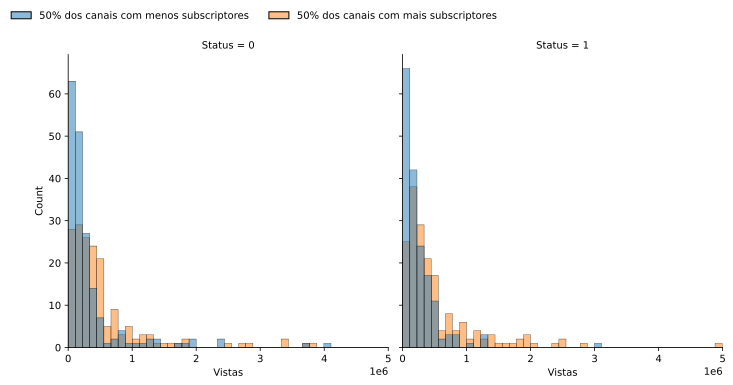

In [24]:
ax=sns.displot(df_amostras, x='Vistas', hue='Q_Subscriptores',col='Status', bins=100);
plt.xlim(0,5000000)
sns.move_legend(ax, "lower right", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)

# plt.savefig(ima+"Hist_Vistas_amostras.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


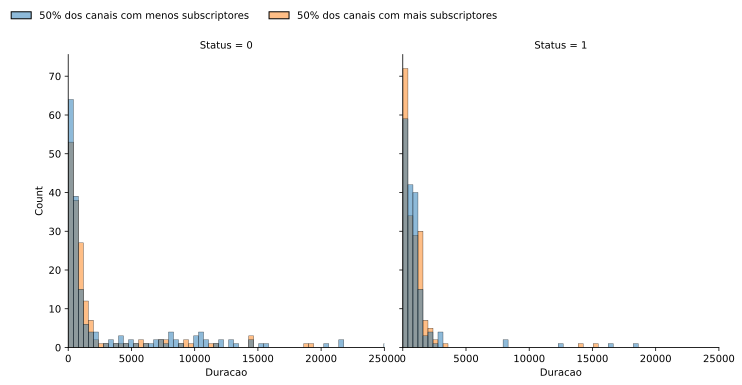

In [25]:
ax=sns.displot(df_amostras, x='Duracao', hue='Q_Subscriptores',col='Status', bins=100);
plt.xlim(0,25000)
sns.move_legend(ax, "lower right", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)

# plt.savefig(ima+"Hist_Duracao_amostras.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


In [ ]:
d=df_amostras.groupby('Status')

In [ ]:
df_amostras['País'].value_counts().values

array([570,  91,   3,   1,   1])

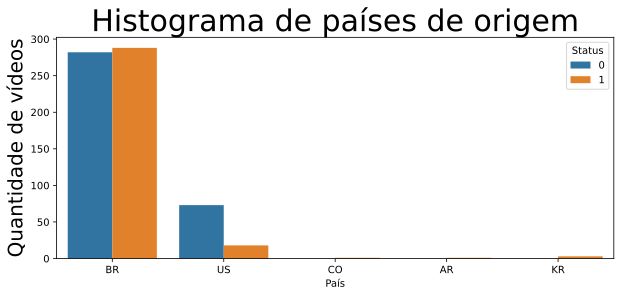

In [ ]:

plt.figure(figsize=(10,4))
sns.countplot(data=df_amostras, x='País',hue='Status')
plt.title("Histograma de países de origem", fontsize=30)


# Add label for vertical axis
plt.ylabel("Quantidade de vídeos",fontsize=20)


# axes[1].sns.barplot(data=df_amostras, x=d.get_group(0)['País'].value_counts().keys(), y=d.get_group(0)['País'].value_counts().values)
# fig.tight_layout()

plt.savefig(ima+"Hist_Pais.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()



In [ ]:
d.get_group(0)['País'].value_counts()

BR    282
US     73
Name: País, dtype: int64

In [ ]:
d.get_group(0)['Duracao'].describe()

count      348.000000
mean      2905.413793
std       5746.146034
min         14.000000
25%        192.750000
50%        659.000000
75%       1747.500000
max      39606.000000
Name: Duracao, dtype: float64

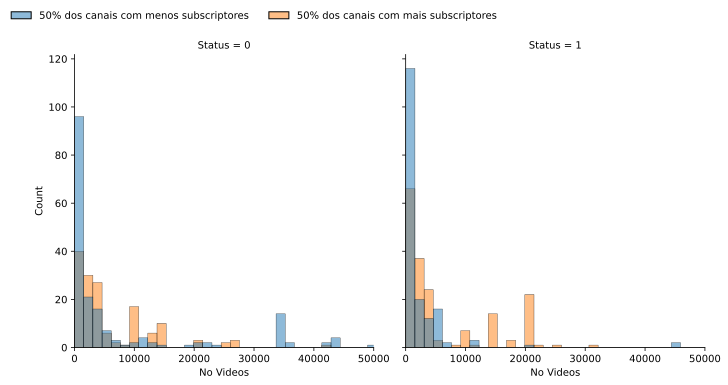

In [ ]:
ax=sns.displot(df_amostras, x='No Videos', hue='Q_Subscriptores',col='Status', bins=100);
plt.xlim(0,50000)
sns.move_legend(ax, "lower right", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)

plt.savefig(ima+"Hist_NoVideos_amostras.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()

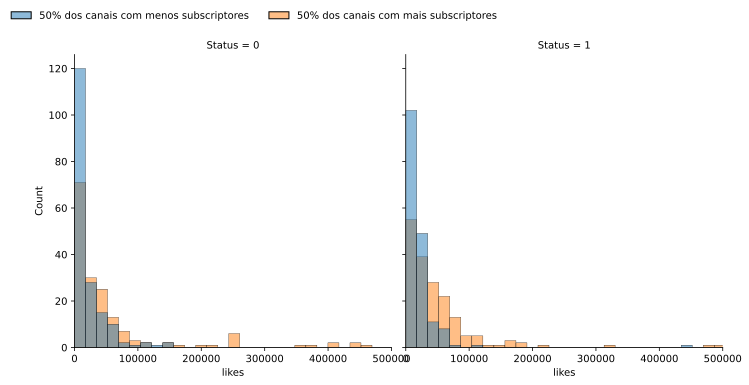

In [ ]:
ax=sns.displot(df_amostras, x='likes', hue='Q_Subscriptores',col='Status', bins=100);
plt.xlim(0,500000)
sns.move_legend(ax, "lower right", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)

plt.savefig(ima+"Hist_likes_amostras.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()

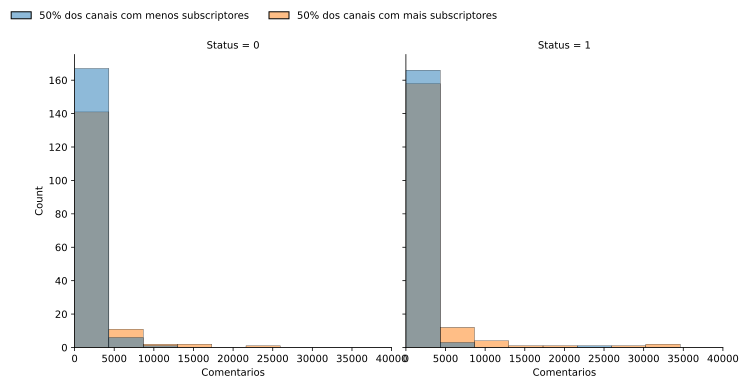

In [ ]:
ax=sns.displot(df_amostras, x='Comentarios', hue='Q_Subscriptores',col='Status', bins=100);
plt.xlim(0,40000)
sns.move_legend(ax, "lower right", bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)

plt.savefig(ima+"Hist_Comentarios_amostras.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()

In [ ]:
d=df_amostras.groupby('Status')
d.get_group(0)['No Videos'].value_counts()

10066    4
33946    3
3519     2
89706    2
22108    2
        ..
1889     1
13720    1
1336     1
1059     1
3762     1
Name: No Videos, Length: 327, dtype: int64

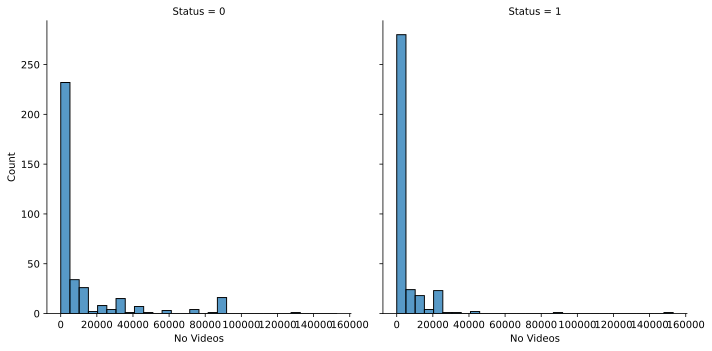

In [ ]:
sns.displot(df_amostras, x='No Videos', col='Status', bins=30)


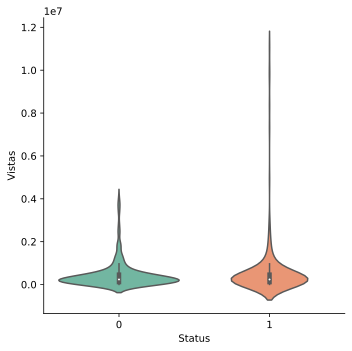

In [ ]:
ax = sns.catplot(x='Status', y='Vistas', kind='violin', data=df_amostras, palette='Set2')

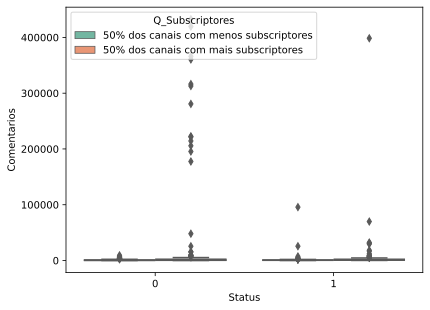

In [ ]:
ax = sns.boxplot(x='Status', y='Comentarios',hue='Q_Subscriptores',  data=df_amostras, palette='Set2')

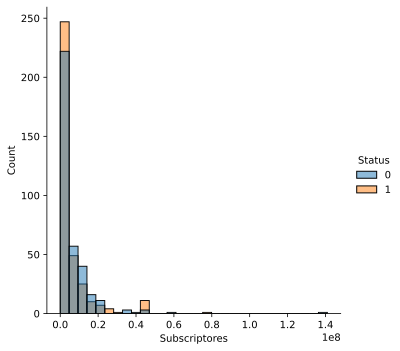

In [ ]:
sns.displot(df_amostras, x='Subscriptores', hue='Status', bins=30);


#### Análise exploratorio quantitativo

Text(0.5, 1.0, 'Correlação da base')

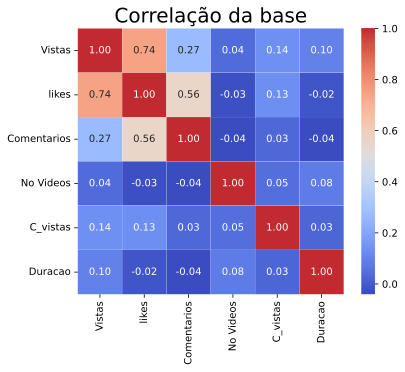

In [ ]:
# Variáveis
quantitativas = ['Vistas', 'likes', 'Comentarios','No Videos','C_vistas','Duracao']
dados_quanti=df_amostras[quantitativas].copy()

# plotar o heatmap para variáveis numéricas
sns.heatmap(df_amostras[quantitativas].corr(), cmap='coolwarm', fmt='.2f', linewidths=0.1,
            vmax=1.0, square=True, linecolor='white', annot=True,center=0.5)

plt.title('Correlação da base',fontsize=20)
# plt.savefig(ima+'Quantitativas.pdf', bbox_inches='tight',pad_inches=0.01)


In [ ]:
dados_status=df_amostras.groupby('Status')

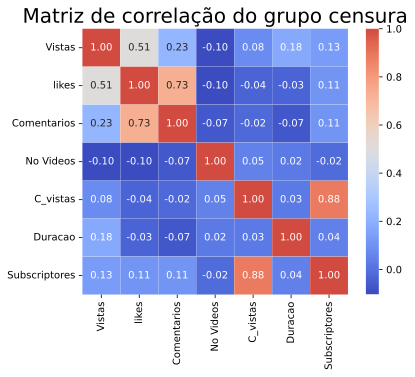

In [ ]:
# Variáveis
quantitativas = ['Vistas', 'likes', 'Comentarios','No Videos','C_vistas','Duracao','Subscriptores']


# plotar o heatmap para variáveis numéricas
sns.heatmap(dados_status.get_group(0)[quantitativas].corr(), cmap='coolwarm', fmt='.2f', linewidths=0.1,
            vmax=1.0, square=True, linecolor='white', annot=True,center=0.5)

plt.title('Matriz de correlação do grupo censura',fontsize=20)
plt.savefig(ima+'Correla_grupo_censu.pdf', bbox_inches='tight',pad_inches=0.01)


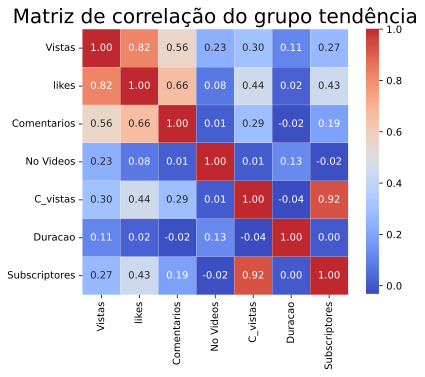

In [ ]:
# Variáveis
quantitativas = ['Vistas', 'likes', 'Comentarios','No Videos','C_vistas','Duracao','Subscriptores']

# corr = df.corr(method = 'spearman') ##Caso alguma vez queramos usar a correlação de Speraman


# plotar o heatmap para variáveis numéricas
sns.heatmap(dados_status.get_group(1)[quantitativas].corr(), cmap='coolwarm', fmt='.2f', linewidths=0.1,
            vmax=1.0, square=True, linecolor='white', annot=True,center=0.5)

plt.title('Matriz de correlação do grupo tendência',fontsize=20)
plt.savefig(ima+'Correla_grupo_tenden.pdf', bbox_inches='tight',pad_inches=0.01)


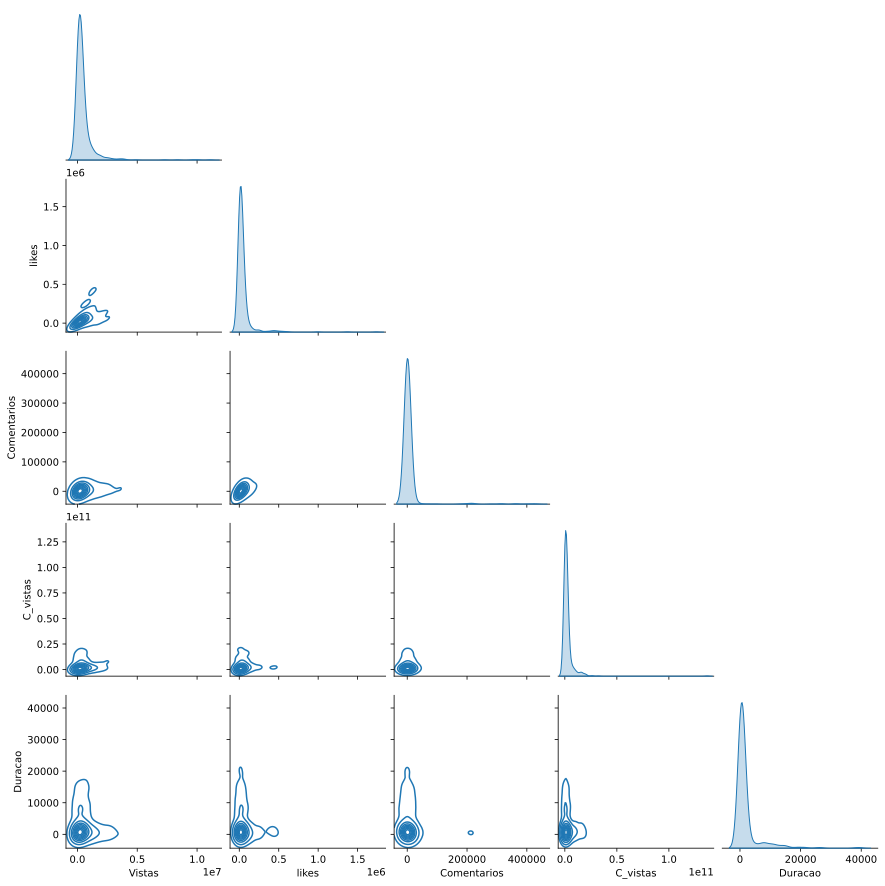

In [ ]:
plt.rcParams.update({'figure.figsize':(12,6), 'figure.dpi':150})

sns.pairplot(df_amostras[quantitativas], kind="kde", corner=True)

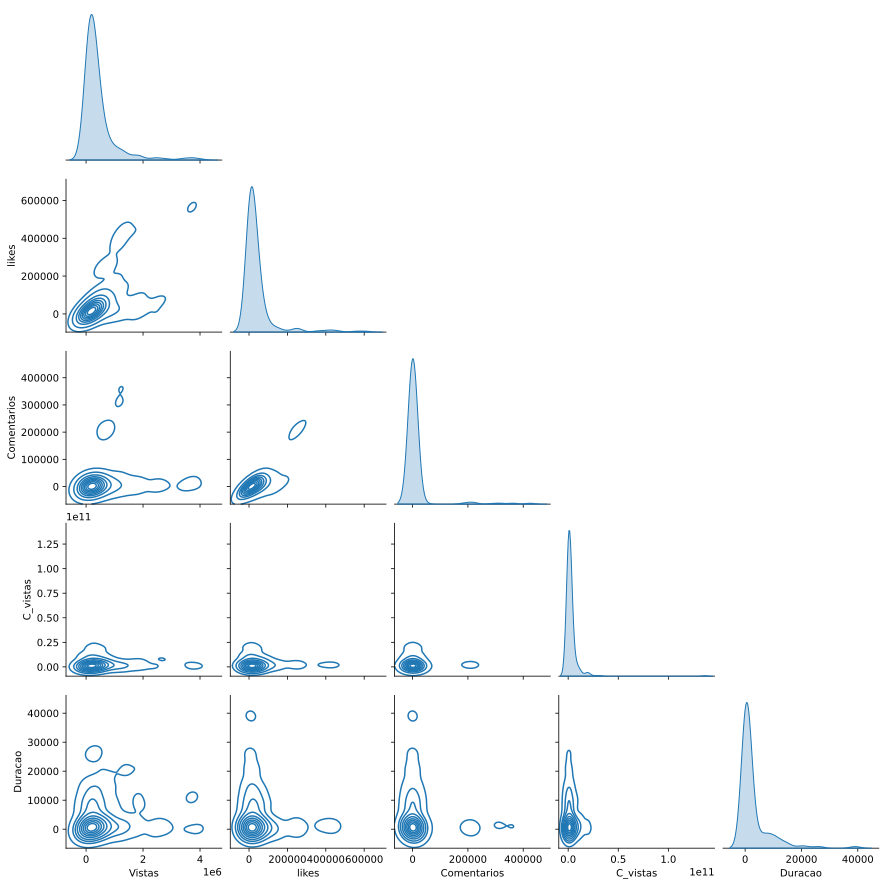

In [ ]:
plt.rcParams.update({'figure.figsize':(12,6), 'figure.dpi':150})

sns.pairplot(dados_status.get_group(0)[quantitativas], kind="kde", corner=True)

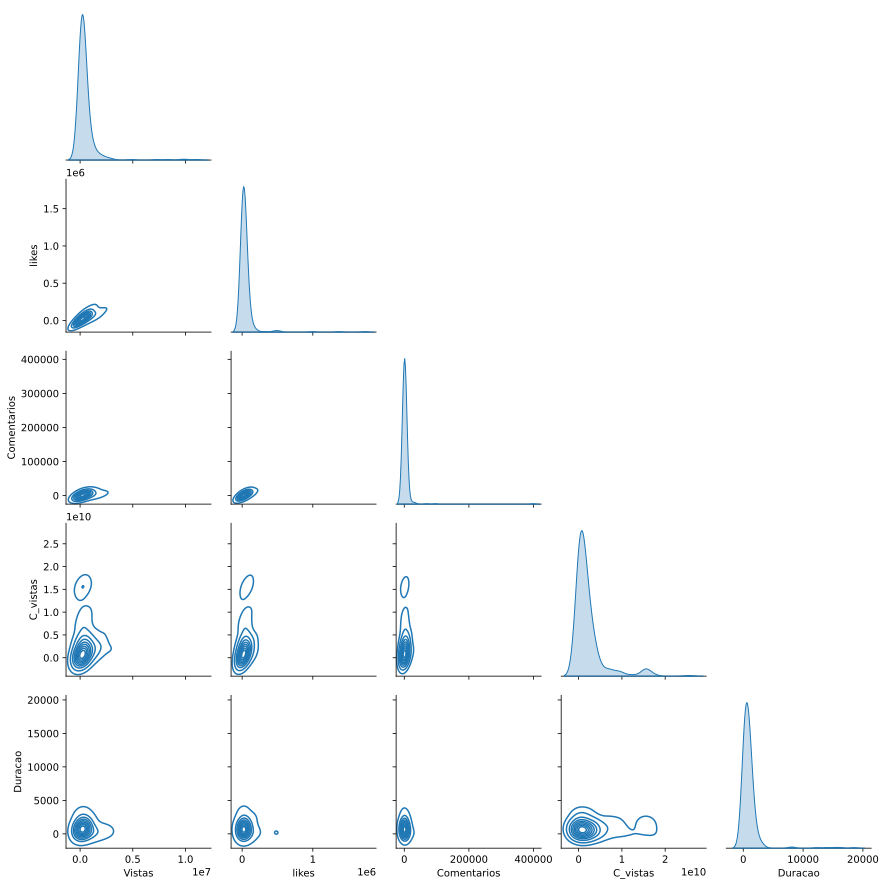

In [ ]:
plt.rcParams.update({'figure.figsize':(12,6), 'figure.dpi':150})

sns.pairplot(dados_status.get_group(1)[quantitativas], kind="kde", corner=True)

## Colocando o tempo até tendência

In [ ]:
link

'/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'

In [ ]:
dados_tendencias=pd.read_csv(link+'tendencias_tratadas.csv',lineterminator='\n') 

In [ ]:
dados_tendencias=dados_tendencias.drop('Unnamed: 0',axis=1)
dados_tendencias.head(2)

,Id,Titulo,Data,C_id,C_titulo,Categoria,Data_tendencia,Etiqueta,Vistas,likes,dislikes,Q_comentarios,Descricao,Duracao,C_Data,Subscriptores
0,s9FH4rDMvds,LEVEI UM FORA? FINGI ESTAR APAIXONADO POR ELA!,2020-08-11 22:21:49+00:00,UCGfBwrCoi9ZJjKiUK8MmJNw,Pietro Guedes,People & Blogs,2020-08-12 00:00:00+00:00,pietro|guedes|ingrid|ohara|pingrid|vlog|amigos...,263835,85095,487,4500,"Salve rapaziada, neste vídeo me declarei pra e...",604.0,2013-06-20 23:16:31+00:00,1070000.0
1,jbGRowa5tIk,ITZY “Not Shy” M/V TEASER,2020-08-11 15:00:13+00:00,UCaO6TYtlC8U5ttz62hTrZgg,JYP Entertainment,Music,2020-08-12 00:00:00+00:00,JYP Entertainment|JYP|ITZY|있지|ITZY Video|ITZY ...,6000070,714310,15176,31040,ITZY Not Shy M/V[ITZY Official] https://www.yo...,21.0,2008-01-25 07:45:44+00:00,25700000.0


In [ ]:
dados_ten_prim=dados_tendencias.drop_duplicates(subset='Id',keep='first')
dados_ten_prim.shape

(23366, 17)

In [ ]:
b=list(dados_ten_prim['Id'])
a=list(df_amostras['Id'])
# d=list(dados_sem['video_id'])

In [ ]:
c=set(a).intersection(b)
len(c)

355

In [ ]:
intersection=list(c)
# intersection

In [ ]:
dados_ten_pre=dados_ten_prim[dados_ten_prim['Id'].isin(intersection)]
dados_ten_pre.shape

(355, 17)

In [ ]:
# dados_ten_pre=dados_ten_pre.set_index('Id')
dados_ten_pre=dados_ten_pre.drop('Unnamed: 0',axis=1)
dados_ten_pre

,Titulo,Data,C_id,C_titulo,Categoria,Data_tendencia,Etiqueta,Vistas,likes,dislikes,Q_comentarios,Descricao,Duracao,C_Data,Subscriptores
Id,,,,,,,,,,,,,,,
sJHYNATW_C4,Joelma - ISSO É CALYPSO AO VIVO NA AMAZÔNIA - ...,2022-08-18 15:00:28+00:00,UClPOJqFbYMKGyM2Nqst0NxA,Joelma Oficial,Music,2022-08-19 00:00:00+00:00,Joelma|São Paulo|Calypso|Brasil,95599,10819,0,3335,INSCREVA-SE NO MEU CANAL: http://bit.ly/Joelma...,234.0,2016-01-16 15:44:05+00:00,1310000.0
XdyRZrVYTEc,Wesley Safadão - Amor ou Esquema - Garota Vip ...,2022-08-19 15:00:08+00:00,UCciJLMuECsXuOyhA4FO48Sg,Wesley Safadão,Music,2022-08-20 00:00:00+00:00,Som Livre (Record Label)|Forró (Musical Genre)...,4540531,101460,0,7270,"Me diz aí, é Amor ou Esquema?LetraAmor ou Esqu...",145.0,2009-06-21 02:40:12+00:00,13500000.0
Tx3WHu4P0_g,VOCÊS VENCERAM! - Meu Setup Novo!,2022-08-19 23:30:40+00:00,UCuxfOdbKQy0tgGXcm9sjHiw,Coisa de Nerd,Science & Technology,2022-08-20 00:00:00+00:00,leon|coisadenerd|coisa de nerd|português|brasi...,174162,31199,0,837,Vídeo do meu setup novo!,744.0,2009-11-05 13:23:43+00:00,11000000.0
dmIwDE8Fs30,BASTIDORES - FLUMINENSE 2 X 2 FORTALEZA | VOLT...,2022-08-19 23:45:19+00:00,UCAAPXtnzlg9krw6MtNbfR-g,Fluminense Football Club,Sports,2022-08-20 00:00:00+00:00,Fluminense Football Club|Fluminense|Clube Flum...,36305,5647,0,306,"Para ficar por dentro do dia a dia do Fluzão, ...",1226.0,2009-10-11 18:36:13+00:00,697000.0
9xE-K8xn1T0,PARECIA PIADA. MAS ACONTECEU!,2022-08-19 22:52:22+00:00,UCNFf1QdVK-73ZODRfpFwubg,Bruno Formiga,Sports,2022-08-20 00:00:00+00:00,CASEMIRO|REAL MADRID|UNITED|CASEMIRO NO MANCHE...,72244,10423,0,656,Casemiro escolhe deixar o Real no auge e aceit...,496.0,2011-08-25 16:11:03+00:00,301000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ysiUUAJmGSc,VASCO 4 X 1 NÁUTICO | MELHORES MOMENTOS | 30ª ...,2022-09-17 00:14:20+00:00,UCgCKagVhzGnZcuP9bSMgMCg,ge,Sports,2022-09-18 00:00:00+00:00,Melhores momentos|futebol|MM|gol|é gol|futebol...,549268,23856,0,1165,Uma goleada do Vasco em casa. O 4 a 1 do Vasco...,219.0,2020-08-04 19:53:16.054503+00:00,2850000.0
s_fRLlUzug0,DESAFIO 1PRA1 - GRANDE FINAL ETAPA CEARÁ - L7 ...,2022-09-17 02:46:16+00:00,UCacMjDLANAoJmxSzxweAV4w,Falcão 12,Sports,2022-09-18 00:00:00+00:00,Falcão|x1|1x1|2x2|1vs1|um pra um|Falcao|Falcão...,34752,1480,0,10,DESAFIO 1x1 CATEGORIA PROJOGO 01:- L7 vs BOLOL...,3120.0,2018-06-06 17:35:57+00:00,1500000.0
aiXdRbXWS0U,"COUTINHO VAI BEM, E ASTON VILLA DERROTA O SOUT...",2022-09-16 21:17:27+00:00,UCw5-xj3AKqEizC7MvHaIPqA,ESPN Brasil,Sports,2022-09-18 00:00:00+00:00,ESPN|ESPN Brasil|Aston Villa|Coutinho|Douglas ...,152160,9519,0,185,Todo o esporte AO VIVO da ESPN disponível tamb...,203.0,2012-01-04 20:13:45+00:00,4490000.0


In [ ]:
d=dados_ten_pre['Data_tendencia'].to_dict()
# d

In [ ]:
def data_tendencia(video):
  aux=0
  if video in d.keys():
    aux=d[video]
  else:
   aux=np.nan
  return aux


In [ ]:
df_amostras['Data_tendencia']=df_amostras['Id'].apply(data_tendencia)

In [ ]:
df_amostras.sample(3)


,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status,Categoria,Duracao,Data_tendencia
665,FUYbxANUE5s,165577.0,24473.0,178.0,UC9eXFedzizQtlY5snZ-IFkg,2022-08-22 21:00:07+00:00,DEI $1000 DÓLARES PRO LUCAS GASTAR NO DIA DOS ...,2017-11-27 03:16:17+00:00,Sunaika Bruna,BR,282331632,3110000.0,376,NaN,1,Entertainment,967.0,2022-08-24 00:00:00+00:00
426,TXv7UoGk8ZI,1200638.0,23772.0,3905.0,UC9k-yiEpRHMNVOnOi_aQK8w,2022-09-06 21:47:16+00:00,NaN,2012-10-09 00:36:32+00:00,Inside Edition,US,19585730281,11100000.0,27441,News Anchor Has Stroke Live on Air,0,News & Politics,122.0,NaN
293,HOcKHIcU_Ak,114970.0,12822.0,644.0,UC3cFOnbfiLe2xLoTPauY4wA,2022-09-14 14:50:11+00:00,NaN,2020-08-24 01:17:33.484753+00:00,Marcelodrv,BR,770236213,3030000.0,384,Trolei minha AMIGA com CARRO na BATALHA DE CON...,1,Gaming,888.0,2022-09-16 00:00:00+00:00


In [ ]:
df_amostras.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 710 entries, 0 to 709
Data columns (total 18 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Id              710 non-null    object 
 1   Vistas          710 non-null    float64
 2   likes           708 non-null    float64
 3   Comentarios     697 non-null    float64
 4   C_id            710 non-null    object 
 5   Data            710 non-null    object 
 6   Título          283 non-null    object 
 7   C_data          710 non-null    object 
 8   C_Título        710 non-null    object 
 9   País            666 non-null    object 
 10  C_vistas        710 non-null    int64  
 11  Subscriptores   710 non-null    float64
 12  No Videos       710 non-null    int64  
 13  Titulo          427 non-null    object 
 14  Status          710 non-null    int64  
 15  Categoria       690 non-null    object 
 16  Duracao         703 non-null    float64
 17  Data_tendencia  355 non-null    obj

In [ ]:
df_amostras['Data_tendencia']=pd.to_datetime(df_amostras['Duracao'])

### Subindo dados agora com tempos de tendência

In [ ]:
with open(link+'amostras_selecionadas.csv', 'w') as f:
  df_amostras.to_csv(f)

In [ ]:
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'

df_amostras=pd.read_csv(link+'amostras_selecionadas.csv')
df_amostras.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 710 entries, 0 to 709
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      710 non-null    int64  
 1   Id              710 non-null    object 
 2   Vistas          710 non-null    float64
 3   likes           708 non-null    float64
 4   Comentarios     697 non-null    float64
 5   C_id            710 non-null    object 
 6   Data            710 non-null    object 
 7   Título          283 non-null    object 
 8   C_data          710 non-null    object 
 9   C_Título        710 non-null    object 
 10  País            666 non-null    object 
 11  C_vistas        710 non-null    int64  
 12  Subscriptores   710 non-null    float64
 13  No Videos       710 non-null    int64  
 14  Titulo          427 non-null    object 
 15  Status          710 non-null    int64  
 16  Categoria       690 non-null    object 
 17  Duracao         703 non-null    flo

Nesta última parte colocalmos a data até tendência dos tendências prematuras, para este proósito focmoas na lista de tendências tratadas e carregamos os dados correspondentes com os vídeos

In [ ]:
df_amostras=df_amostras.drop('Unnamed: 0',axis=1)
df_amostras.head()

,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_data,C_Título,País,C_vistas,Subscriptores,No Videos,Titulo,Status,Categoria,Duracao,Data_tendencia
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,UC63iwP6BtIjxB6xn1GKR6Lw,2022-09-08 19:45:33+00:00,NaN,2015-01-30 00:13:30+00:00,Emilly Vick,BR,986194410,2880000.0,154,FUI EXPULSA DA LOJA PELO SEGURANÇA *deu muito ...,0,Science & Technology,27.0,NaN
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,UCiIZY89KwQkxAW-4Le7U7zg,2022-09-13 21:10:17+00:00,NaN,2011-01-18 00:36:12+00:00,viniccius13,BR,872438573,5850000.0,505,A Forja do Golem Gigante - Minecraft Em busca ...,1,Gaming,2104.0,2022-09-15 00:00:00+00:00
2,-hsugN7exHg,475631.0,36581.0,36.0,UCjaxmdb_gTWbz9XF5rzvgGg,2022-09-13 21:28:00+00:00,NaN,2017-02-12 23:54:17+00:00,Natan por Aí,BR,2738305091,5080000.0,891,"UMA BALA, UM MORTAL! #shorts",0,Entertainment,34.0,NaN
3,DqgK4llE1cw,475929.0,106448.0,4314.0,UC8CX0LD98EDXl4UYX1MDCXg,2022-08-22 13:00:13+00:00,Fire Again ft. Ashnikko // Official Music Vide...,2020-01-31 04:50:39.775767+00:00,VALORANT,US,226527323,1690000.0,107,NaN,1,Gaming,209.0,2022-08-23 00:00:00+00:00
4,NAyL32Eh_hk,21676.0,2645.0,380.0,UCpcHFJwDFlrnbCw3yD-4Wzg,2022-08-29 13:15:11+00:00,MAVİ OYUNCAK PEŞİMİZE DÜŞTÜ | RAİNBOW FRİENDS ...,2013-10-29 14:09:43+00:00,Han Kanal,US,1925956665,2280000.0,3836,NaN,0,Gaming,1761.0,NaN


In [ ]:

df_amostras.dtypes

Id                             object
Vistas                        float64
likes                         float64
Comentarios                   float64
C_id                           object
Data              datetime64[ns, UTC]
Título                         object
C_data            datetime64[ns, UTC]
C_Título                       object
País                           object
C_vistas                        int64
Subscriptores                 float64
No Videos                       int64
Titulo                         object
Status                          int64
Categoria                      object
Duracao                       float64
Data_tendencia    datetime64[ns, UTC]
dtype: object

In [ ]:
sobrevivencias=['Id','Vistas','likes','Comentarios','País','C_vistas','Subscriptores','No Videos','Status','Categoria','Duracao','Data','Data_tendencia','C_data']

In [ ]:
df_sobre_amostras=df_amostras[sobrevivencias]
# df_sobre_amostras

In [ ]:
df_sobre_amostras.head(3)

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,NaN,2015-01-30 00:13:30+00:00
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,NaN,2017-02-12 23:54:17+00:00


In [ ]:
d=df_sobre_amostras['Data_tendencia'].to_dict()
# d


In [ ]:
a=['2022-09-19 23:22:58+00:00' if i%2==0 else d[i] for i in d.keys()]

In [ ]:
df_sobre_amostras['Data_tendencia']=a

/tmp/ipykernel_6312/1151298395.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['Data_tendencia']=a


In [ ]:
df_sobre_amostras

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,2022-09-19 23:22:58+00:00,2015-01-30 00:13:30+00:00
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,2022-09-19 23:22:58+00:00,2017-02-12 23:54:17+00:00
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,2022-08-23 00:00:00+00:00,2020-01-31 04:50:39.775767+00:00
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,2022-09-19 23:22:58+00:00,2013-10-29 14:09:43+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,NaN,4002388776,7370000.0,209,1,Music,408.0,2022-08-22 13:00:05+00:00,2022-08-23 00:00:00+00:00,2006-10-16 19:24:34+00:00
706,alvITFiNJqo,113122.0,3942.0,141.0,US,10090446697,16800000.0,129948,0,News & Politics,451.0,2022-09-16 14:30:11+00:00,2022-09-19 23:22:58+00:00,2015-10-21 17:23:43+00:00
707,4_45aefDzac,113095.0,11631.0,193.0,BR,696759827,2310000.0,2817,1,Gaming,981.0,2022-08-25 21:30:01+00:00,2022-08-27 00:00:00+00:00,2011-10-25 00:12:52+00:00
708,2S62_-2sRTE,539076.0,40810.0,1340.0,BR,1890888768,4850000.0,3762,0,Entertainment,1501.0,2022-09-07 01:15:00+00:00,2022-09-19 23:22:58+00:00,2016-04-18 16:16:19+00:00


In [ ]:
df_sobre_amostras

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,None,2015-01-30 00:13:30+00:00
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,None,2011-01-18 00:36:12+00:00
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,None,2017-02-12 23:54:17+00:00
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,None,2020-01-31 04:50:39.775767+00:00
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,None,2013-10-29 14:09:43+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,NaN,4002388776,7370000.0,209,1,Music,408.0,2022-08-22 13:00:05+00:00,None,2006-10-16 19:24:34+00:00
706,alvITFiNJqo,113122.0,3942.0,141.0,US,10090446697,16800000.0,129948,0,News & Politics,451.0,2022-09-16 14:30:11+00:00,None,2015-10-21 17:23:43+00:00
707,4_45aefDzac,113095.0,11631.0,193.0,BR,696759827,2310000.0,2817,1,Gaming,981.0,2022-08-25 21:30:01+00:00,None,2011-10-25 00:12:52+00:00
708,2S62_-2sRTE,539076.0,40810.0,1340.0,BR,1890888768,4850000.0,3762,0,Entertainment,1501.0,2022-09-07 01:15:00+00:00,None,2016-04-18 16:16:19+00:00


/tmp/ipykernel_6312/3512917244.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['tempo_ate']=df_sobre_amostras['Data_tendencia']-df_sobre_amostras['Data']


In [ ]:
df_sobre_amostras

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data,tempo_ate
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,NaT,2015-01-30 00:13:30+00:00,NaT
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00,1 days 02:49:43
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,NaT,2017-02-12 23:54:17+00:00,NaT
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,2022-08-23 00:00:00+00:00,2020-01-31 04:50:39.775767+00:00,0 days 10:59:47
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,NaT,2013-10-29 14:09:43+00:00,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,NaN,4002388776,7370000.0,209,1,Music,408.0,2022-08-22 13:00:05+00:00,2022-08-23 00:00:00+00:00,2006-10-16 19:24:34+00:00,0 days 10:59:55
706,alvITFiNJqo,113122.0,3942.0,141.0,US,10090446697,16800000.0,129948,0,News & Politics,451.0,2022-09-16 14:30:11+00:00,NaT,2015-10-21 17:23:43+00:00,NaT
707,4_45aefDzac,113095.0,11631.0,193.0,BR,696759827,2310000.0,2817,1,Gaming,981.0,2022-08-25 21:30:01+00:00,2022-08-27 00:00:00+00:00,2011-10-25 00:12:52+00:00,1 days 02:29:59
708,2S62_-2sRTE,539076.0,40810.0,1340.0,BR,1890888768,4850000.0,3762,0,Entertainment,1501.0,2022-09-07 01:15:00+00:00,NaT,2016-04-18 16:16:19+00:00,NaT


In [ ]:
df_sobre_amostras['Data']=pd.to_datetime(df_sobre_amostras['Data'])
df_sobre_amostras['C_data']=pd.to_datetime(df_sobre_amostras['C_data'])
df_sobre_amostras['Data_tendencia']=pd.to_datetime(df_sobre_amostras['Data_tendencia'])

/tmp/ipykernel_6312/3179900264.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['Data']=pd.to_datetime(df_sobre_amostras['Data'])
/tmp/ipykernel_6312/3179900264.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['C_data']=pd.to_datetime(df_sobre_amostras['C_data'])
/tmp/ipykernel_6312/3179900264.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in t

In [ ]:
df_sobre_amostras.dtypes

Id                             object
Vistas                        float64
likes                         float64
Comentarios                   float64
País                           object
C_vistas                        int64
Subscriptores                 float64
No Videos                       int64
Status                          int64
Categoria                      object
Duracao                       float64
Data              datetime64[ns, UTC]
Data_tendencia    datetime64[ns, UTC]
C_data            datetime64[ns, UTC]
dtype: object

In [ ]:
df_sobre_amostras['tempo_ate']=df_sobre_amostras['Data_tendencia']-df_sobre_amostras['Data']

/tmp/ipykernel_6312/3512917244.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['tempo_ate']=df_sobre_amostras['Data_tendencia']-df_sobre_amostras['Data']


In [ ]:
df_sobre_amostras

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data,tempo_ate
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,2022-09-19 23:22:58+00:00,2015-01-30 00:13:30+00:00,11 days 03:37:25
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00,1 days 02:49:43
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,2022-09-19 23:22:58+00:00,2017-02-12 23:54:17+00:00,6 days 01:54:58
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,2022-08-23 00:00:00+00:00,2020-01-31 04:50:39.775767+00:00,0 days 10:59:47
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,2022-09-19 23:22:58+00:00,2013-10-29 14:09:43+00:00,21 days 10:07:47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,NaN,4002388776,7370000.0,209,1,Music,408.0,2022-08-22 13:00:05+00:00,2022-08-23 00:00:00+00:00,2006-10-16 19:24:34+00:00,0 days 10:59:55
706,alvITFiNJqo,113122.0,3942.0,141.0,US,10090446697,16800000.0,129948,0,News & Politics,451.0,2022-09-16 14:30:11+00:00,2022-09-19 23:22:58+00:00,2015-10-21 17:23:43+00:00,3 days 08:52:47
707,4_45aefDzac,113095.0,11631.0,193.0,BR,696759827,2310000.0,2817,1,Gaming,981.0,2022-08-25 21:30:01+00:00,2022-08-27 00:00:00+00:00,2011-10-25 00:12:52+00:00,1 days 02:29:59
708,2S62_-2sRTE,539076.0,40810.0,1340.0,BR,1890888768,4850000.0,3762,0,Entertainment,1501.0,2022-09-07 01:15:00+00:00,2022-09-19 23:22:58+00:00,2016-04-18 16:16:19+00:00,12 days 22:07:58


In [ ]:
df_sobre_amostras['tempo_ate']=pd.to_numeric(df_sobre_amostras['tempo_ate'],errors='coerce',downcast="integer")

/tmp/ipykernel_6312/388651593.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['tempo_ate']=pd.to_numeric(df_sobre_amostras['tempo_ate'],errors='coerce',downcast="integer")


In [ ]:
df_sobre_amostras['tempo_ate']=df_sobre_amostras['tempo_ate']/(1000000000*3525)

/tmp/ipykernel_6312/4177217786.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sobre_amostras['tempo_ate']=df_sobre_amostras['tempo_ate']/(1000000000*3525)


In [ ]:
df_sobre_amostras

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data,tempo_ate
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,2022-09-19 23:22:58+00:00,2015-01-30 00:13:30+00:00,273.317730
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00,27.399433
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,2022-09-19 23:22:58+00:00,2017-02-12 23:54:17+00:00,149.020709
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,2022-08-23 00:00:00+00:00,2020-01-31 04:50:39.775767+00:00,11.230355
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,2022-09-19 23:22:58+00:00,2013-10-29 14:09:43+00:00,525.068652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
705,9FnG9lGLyEM,222943.0,57645.0,4074.0,NaN,4002388776,7370000.0,209,1,Music,408.0,2022-08-22 13:00:05+00:00,2022-08-23 00:00:00+00:00,2006-10-16 19:24:34+00:00,11.232624
706,alvITFiNJqo,113122.0,3942.0,141.0,US,10090446697,16800000.0,129948,0,News & Politics,451.0,2022-09-16 14:30:11+00:00,2022-09-19 23:22:58+00:00,2015-10-21 17:23:43+00:00,82.600567
707,4_45aefDzac,113095.0,11631.0,193.0,BR,696759827,2310000.0,2817,1,Gaming,981.0,2022-08-25 21:30:01+00:00,2022-08-27 00:00:00+00:00,2011-10-25 00:12:52+00:00,27.063546
708,2S62_-2sRTE,539076.0,40810.0,1340.0,BR,1890888768,4850000.0,3762,0,Entertainment,1501.0,2022-09-07 01:15:00+00:00,2022-09-19 23:22:58+00:00,2016-04-18 16:16:19+00:00,316.731348


In [ ]:
df_sobre_amostras['tempo_ate'].describe()

count    710.000000
mean     216.035735
std      251.018300
min       -3.116879
25%       24.002270
50%       34.805674
75%      443.239645
max      798.516028
Name: tempo_ate, dtype: float64

### Salvando com os tempos de censura

In [ ]:
with open(link+'amostras_selecionadas_censuradas.csv', 'w') as f:
  df_sobre_amostras.to_csv(f)

### Convertendo o tempo até tendência em segundos

Com a finalidade de fazer operações aritméticas podemos coverter os dados da coluna tempo ate para fazer operações aritméticas 

,errors='coerce',downcast="integer"

## Análise de sobrevivência da base amostra  

In [88]:
import pandas as pd
import lifelines
import numpy as np
import seaborn as sns

In [89]:
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'
ima='/home/brayan/Dropbox/Latex/MBA/TCC/USPSC-v2.1/USPSC-img/'
df_sobre_amostras=pd.read_csv(link+'amostras_selecionadas_censuradas.csv',index_col=0)
df_sobre_amostras.head()

,Id,Vistas,likes,Comentarios,País,C_vistas,Subscriptores,No Videos,Status,Categoria,Duracao,Data,Data_tendencia,C_data,tempo_ate
0,Gj1LwsjHBcQ,884424.0,96151.0,260.0,BR,986194410,2880000.0,154,0,Science & Technology,27.0,2022-09-08 19:45:33+00:00,2022-09-19 23:22:58+00:00,2015-01-30 00:13:30+00:00,273.317730
1,NBPk2JA9NRE,879906.0,161515.0,5321.0,BR,872438573,5850000.0,505,1,Gaming,2104.0,2022-09-13 21:10:17+00:00,2022-09-15 00:00:00+00:00,2011-01-18 00:36:12+00:00,27.399433
2,-hsugN7exHg,475631.0,36581.0,36.0,BR,2738305091,5080000.0,891,0,Entertainment,34.0,2022-09-13 21:28:00+00:00,2022-09-19 23:22:58+00:00,2017-02-12 23:54:17+00:00,149.020709
3,DqgK4llE1cw,475929.0,106448.0,4314.0,US,226527323,1690000.0,107,1,Gaming,209.0,2022-08-22 13:00:13+00:00,2022-08-23 00:00:00+00:00,2020-01-31 04:50:39.775767+00:00,11.230355
4,NAyL32Eh_hk,21676.0,2645.0,380.0,US,1925956665,2280000.0,3836,0,Gaming,1761.0,2022-08-29 13:15:11+00:00,2022-09-19 23:22:58+00:00,2013-10-29 14:09:43+00:00,525.068652


<AxesSubplot:title={'center':'Curva empírica de sobrevivência'}, xlabel='timeline', ylabel='Fração de sobrevivência'>

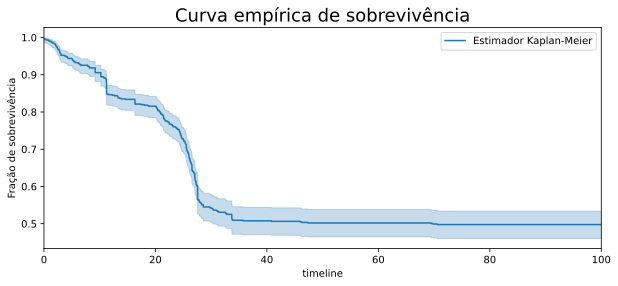

In [90]:
from lifelines import KaplanMeierFitter

import matplotlib.pyplot as plt 

import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='svg'

## Example Data 
durations = list(df_sobre_amostras['tempo_ate'])
event_observed = list(df_sobre_amostras['Status'])

## create an kmf object
kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(durations, event_observed,label='Estimador Kaplan-Meier')

N, M = 10, 4
fig, ax = plt.subplots(figsize=(N, M))
plt.xlim(0, 100)

plt.title('Curva empírica de sobrevivência',fontsize=18)

plt.ylabel('Fração de sobrevivência')
plt.xlabel('Tempos de falha')

kmf.plot(ax=ax) ## ci_show is meant for Confidence interval, since our data set is too tiny,
# plt.savefig(ima+"Sobrevivencia_geral_base_amos.pdf", bbox_inches='tight',pad_inches=0.1)




<AxesSubplot:xlabel='timeline'>

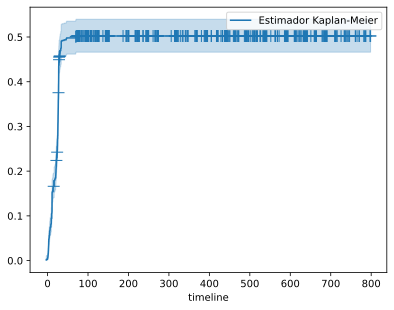

In [7]:
kmf.plot_cumulative_density(show_censors=True)

Text(0.5, 0, 'Tempo em días')

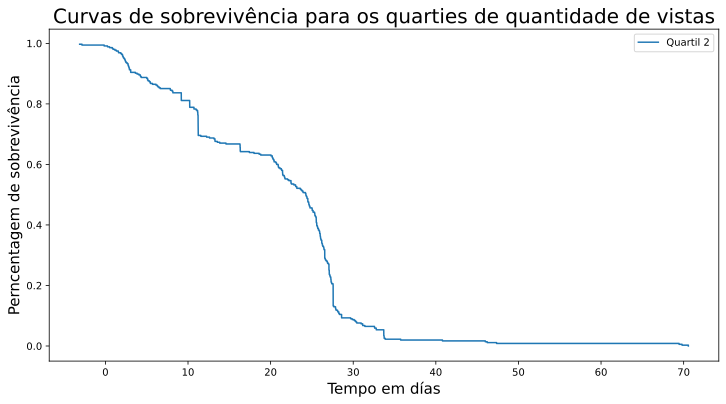

In [8]:
kmf = KaplanMeierFitter() 


T = df_sobre_amostras['tempo_ate']     ## time to event
E = df_sobre_amostras['Status']      ## event occurred or censored


groups = df_sobre_amostras['Status']             ## Create the cohorts from the 'Contract' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1

# plt.figu

plt.figure(figsize=(12,6))

# kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot(ci_show=False)



plt.title('Curvas de sobrevivência para os quarties de quantidade de vistas',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em días',fontsize=15)

# ax.legend(loc='upper right')
# plt.savefig(ima+"Curvas_sobre_vistas.pdf", bbox_inches='tight',pad_inches=0.1)
# plt.show()

#### Por quarties de durações

Segmentação

In [11]:
df_sobre_amostras['Q_Duracao']=pd.qcut(df_sobre_amostras['Duracao'], 
                             q = 4, labels = False)

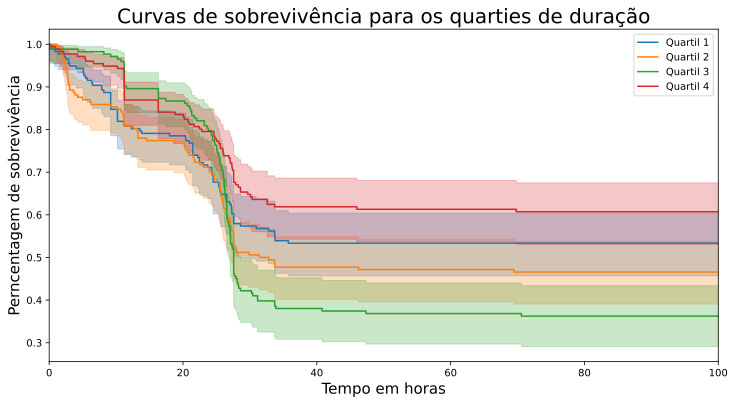

In [12]:
kmf = KaplanMeierFitter() 


T = df_sobre_amostras['tempo_ate']     ## time to event
E = df_sobre_amostras['Status']      ## event occurred or censored


groups = df_sobre_amostras['Q_Duracao']            ## Create the cohorts from the 'Contract' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)         ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 100)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de duração',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
# plt.savefig(ima+"sobre_quart_dura_amos.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()

In [13]:
df_sobre_amostras['Q_Comentarios']=pd.qcut(df_sobre_amostras['Comentarios'], 
                             q = 4, labels = False)

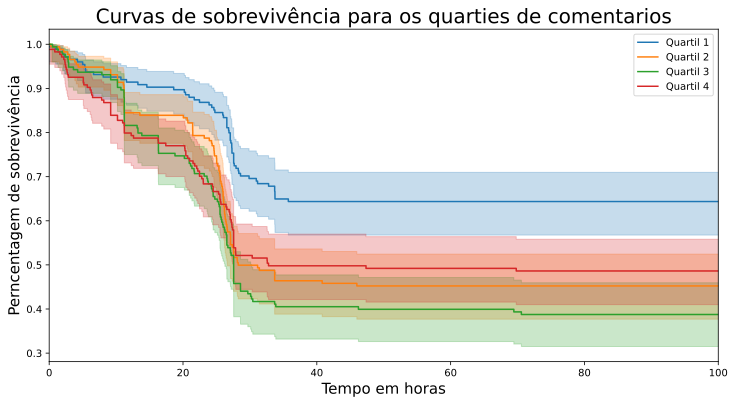

In [15]:
kmf = KaplanMeierFitter() 


T = df_sobre_amostras['tempo_ate']     ## time to event
E = df_sobre_amostras['Status']      ## event occurred or censored


groups = df_sobre_amostras['Q_Comentarios']         ## Create the cohorts from the 'Contract' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)         ## Cohort 2
ix3 = (groups == 3)

# plt.figu

plt.figure(figsize=(12,6))
plt.xlim(0, 100)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de comentarios',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
# plt.savefig(ima+"sobre_quart_comenta_amos.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()

#### Segmentação or categoria

In [16]:
categories=[i for i in df_sobre_amostras['Categoria'].value_counts().keys()]
# categories

In [17]:
categories

['Entertainment',
 'Sports',
 'Gaming',
 'News & Politics',
 'Music',
 'People & Blogs',
 'Film & Animation',
 'Comedy',
 'Science & Technology',
 'Autos & Vehicles',
 'Howto & Style',
 'Pets & Animals',
 'Education']

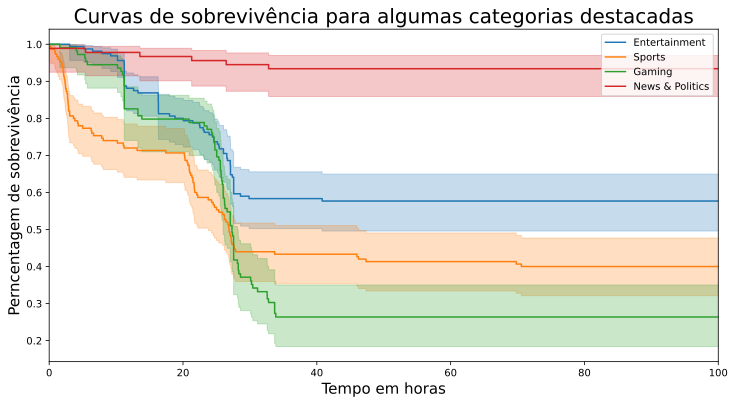

In [19]:
kmf = KaplanMeierFitter() 


T = df_sobre_amostras['tempo_ate']     ## time to event
E = df_sobre_amostras['Status']      ## event occurred or censored


groups = df_sobre_amostras['Categoria']             ## Create the cohorts from the 'Contract' column

ix0 = (groups == categories[0])   ## Cohort 0
ix1 = (groups == categories[1])   ## Cohort 1
ix2 = (groups == categories[2])         ## Cohort 2
ix3 = (groups == categories[3])         ## Cohort 3
ix4 = (groups == categories[4])   ## Cohort 0
ix5 = (groups == categories[5])   ## Cohort 1
ix6 = (groups == categories[6])         ## Cohort 2
ix7 = (groups == categories[7])         ## Cohort 3
ix8 = (groups == categories[8])   ## Cohort 0
ix9 = (groups == categories[9])   ## Cohort 1
ix10 = (groups == categories[10])         ## Cohort 2
ix11 = (groups == categories[11])
ix12 = (groups == categories[12])         ## Cohort 2




# plt.figu

plt.figure(figsize=(12,6))
plt.xlim(0, 100)
kmf.fit(T[ix0], E[ix0], label=categories[0])    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label=categories[1])    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label=categories[2])         ## fit the cohort 2 data
ax1 = kmf.plot()


kmf.fit(T[ix3], E[ix3], label=categories[3])        ## fit the cohort 3 data
kmf.plot()                                 ## Plot the KM curve for three cohort on same x and y axis

# kmf.fit(T[ix4], E[ix4], label=categories[4])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix5], E[ix5], label=categories[5])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix6], E[ix6], label=categories[6])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)

# kmf.fit(T[ix7], E[ix7], label=categories[7])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)


# kmf.fit(T[ix10], E[ix10], label=categories[10])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)


# kmf.fit(T[ix11], E[ix11], label=categories[11])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)

# kmf.fit(T[ix12], E[ix12], label=categories[12])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)


# kmf.fit(T[ix13], E[ix13], label=categories[13])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)

plt.title('Curvas de sobrevivência para algumas categorias destacadas',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
# plt.savefig(ima+"sobre_cate_amos.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


## Forma compacta de amostrar

Nesta seção vamos definir diferentes métricas para escolher amostras de 355 vídeos,

fizemos antes isto escolhendo um amostra baseada no número de visualizações, e filtrando pelo país de origem, porem nos vamos agora escolher diversos criterios e compactar todos eles numa tabela de resultados.

In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

%matplotlib inline
%config InlineBackend.figure_format='svg'

ima='/home/brayan/Dropbox/Latex/MBA/TCC/USPSC-v2.1/USPSC-img/'
link='/home/brayan/GoogleDrive/MyCopy/You_tube_database/archive/'


dados_tendencias=pd.read_csv(link+'tendencias_tratadas.csv',lineterminator='\n')
dados_tendencias=dados_tendencias.drop(columns='Unnamed: 0')
dados_tendencias['Data']= pd.to_datetime(dados_tendencias['Data'])
dados_tendencias['C_Data']= pd.to_datetime(dados_tendencias['C_Data'])
dados_tendencias['Data_tendencia']= pd.to_datetime(dados_tendencias['Data_tendencia'])
dados_amostras=pd.read_csv(link+'amostra_de_videos.csv')
dados_amostras=dados_amostras.drop(columns='Unnamed: 0')
dados_amostras=dados_amostras.rename(columns={'id':'Id'})
dados_amostras['Data']= pd.to_datetime(dados_amostras['Data'])
dados_amostras['C_Data']= pd.to_datetime(dados_amostras['C_Data'])
b=list(dados_tendencias['Id'])
a=list(dados_amostras['Id'])
# d=list(dados_sem['video_id'])

c=set(a).intersection(b)
len(c)


/tmp/ipykernel_6360/1646954656.py:20: DtypeWarning: Columns (7,14) have mixed types. Specify dtype option on import or set low_memory=False.
  dados_amostras=pd.read_csv(link+'amostra_de_videos.csv')


355

In [30]:

# print(dados_amostras.info())
# print(dados_tendencias.info())
dados_tendencias.columns
# dados_tendencias=dados_tendencias.loc[dados_tendencias['Subscriptores']!=0]
# dados_tendencias.loc[dados_tendencias['Data']>'2022']['No Videos'].describe()
# sns.histplot(dados_tendencias['Subscriptores'],bins=100,binrange=[0,20000000])


Index(['Id', 'Titulo', 'Data', 'C_id', 'C_titulo', 'Categoria',
       'Data_tendencia', 'Etiqueta', 'Vistas', 'likes', 'dislikes',
       'Q_comentarios', 'Descricao', 'Duracao', 'C_Data', 'Subscriptores'],
      dtype='object')

In [2]:
amostras_primeira=dados_amostras.drop_duplicates(subset='Id',keep='first')
tendencias_primeira=dados_tendencias.drop_duplicates(subset='Id',keep='first')

dados_inter_amostra=dados_amostras.loc[dados_amostras['Id'].isin(list(c))]
dados_inter=tendencias_primeira.loc[tendencias_primeira['Id'].isin(list(c))]
print('Quantidade de videos interseção na base amostra \n',dados_inter_amostra.shape,len(dados_inter_amostra['Id'].unique()))
print('Quantidade de videos interseção na base tendências \n',dados_inter.shape,len(dados_inter['Id'].unique()))

# amostras_com_ten.columns

# Criando o dataframe


amostras_sem_ten=amostras_primeira[~amostras_primeira['Id'].isin(list(c))]

print('Quantidades de videos amostra que não foram tendnecia',amostras_sem_ten.shape)

intesection=list(c)
amostras_com_ten=amostras_primeira[amostras_primeira['Id'].isin(intesection)]
print('Quantidades de videos amostra que foram tendnecia',amostras_com_ten.shape)

dados_inter=dados_inter.set_index('Id')
d_data_tendencia=dados_inter['Data_tendencia'].to_dict()


def distancia(a,b):
    return(np.abs(a-b))




Quantidade de videos interseção na base amostra 
 (2314, 16) 355
Quantidade de videos interseção na base tendências 
 (355, 16) 355
Quantidades de videos amostra que não foram tendnecia (30809, 16)
Quantidades de videos amostra que foram tendnecia (355, 16)


In [5]:
# d_data_tendencia

In [3]:

amostras_com_ten['Data_tendencia']=amostras_com_ten['Id'].map(d_data_tendencia)
amostras_com_ten['Tempo_ate_tendencia']=amostras_com_ten['Data_tendencia']-amostras_com_ten['Data']
amostras_com_ten['Tempo_ate_tendencia']=(amostras_com_ten['Tempo_ate_tendencia'].dt.total_seconds()/3600).round(0)
amostras_com_ten=amostras_com_ten.drop(columns='Data_tendencia')
amostras_com_ten.reset_index(drop=True,inplace=True)

status2=[1]*355
# status

amostras_com_ten2=amostras_com_ten.copy()
amostras_com_ten2['Status']=status2


# amostras_com_ten.head()

/tmp/ipykernel_6360/1312482037.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amostras_com_ten['Data_tendencia']=amostras_com_ten['Id'].map(d_data_tendencia)
/tmp/ipykernel_6360/1312482037.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  amostras_com_ten['Tempo_ate_tendencia']=amostras_com_ten['Data_tendencia']-amostras_com_ten['Data']
/tmp/ipykernel_6360/1312482037.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

In [23]:
# d_data_tendencia

In [20]:


amostras_sem_ten['Censura']='2022-09-19 00:00:00+0000'
amostras_sem_ten['Censura']=pd.to_datetime(amostras_sem_ten['Censura'])
amostras_sem_ten['Tempo_ate_tendencia']=amostras_sem_ten['Censura']-amostras_sem_ten['Data']
amostras_sem_ten['Tempo_ate_tendencia']=(amostras_sem_ten['Tempo_ate_tendencia'].dt.total_seconds()/3600).round(0)
amostras_sem_ten=amostras_sem_ten.drop(columns='Censura')
amostras_sem_ten.reset_index(drop=True,inplace=True)


#  Filtro Brasil e estados unidos


amostras_sem_ten=amostras_sem_ten[amostras_sem_ten['Pais'].isin(['BR','US'])]

print('Quantidade de amostras sem tendências depois de filtro País',amostras_sem_ten.shape)

amostras_sem_ten.reset_index(drop=True,inplace=True)


# Diccionario com chaves o index e valores o critério
# Escolha um apção emntre:'Vistas' 'likes','Comentarios','C_Vistas','Subscriptores','No Videos','Duracao'


var='Duracao'
d_sem=amostras_sem_ten[var].to_dict()
# d_sem


df=pd.DataFrame(columns = list(amostras_sem_ten.columns),index = range(710))


i=0
for video in intesection:
    d={}# dicionario para video tendencia
    d_agre={} # Dicionario para video mais róximo a tendencia
    d=amostras_com_ten.loc[amostras_com_ten['Id']==video].to_dict(orient='index')
    # dados do video tendencia
    d_dif={}# dicionario de distancias
    key=list(d.keys())[0]#chave do video tendecia
    v=d[key][var]# quantidade de var do video tendencia 

    for j in range(len(amostras_sem_ten)):
        d_dif[j]=distancia(v,d_sem[j])
    
    
    d_agre=amostras_sem_ten.iloc[min(d_dif, key=d_dif.get)].to_dict()
    #pegue os dados do video que não é tendencia e que é mais próximo em quantidade var do 
    #video que s é tendência
    df.iloc[i]=list(d_agre.values())
    #agrefue uma linha  com o vídeo que não é tendência
    df.iloc[i+1]=list(d[key].values())
    #agregue a lista do vídeo que si é tendência
    d_sem[min(d_dif, key=d_dif.get)]=-100000000
    # obtendo a chave e a distancia do elemento mais próximo
    #prencha o valor do elemento mais próximo arbitrariamente negativo para que não tenha 
    # forma de ser escolhido de novo
    i=i+2 # preenchio duas linhas, então pule dois na cntagem

    
# 0 para não foi observado coimo tendência até o final do estudo
# 1 para foi observada a tendência
status=[0,1]*355
# status

df['Status']=status
# df

df['Vistas']=pd.to_numeric(df['Vistas'])
df['C_Vistas']=pd.to_numeric(df['C_Vistas'])
df['Duracao']=pd.to_numeric(df['Duracao'])
df['likes']=pd.to_numeric(df['likes'])
df['Comentarios']=pd.to_numeric(df['Comentarios'])
df['Subscriptores']=pd.to_numeric(df['Subscriptores'])
df['No Videos']=pd.to_numeric(df['No Videos'])
df['Data']= pd.to_datetime(df['Data'])
df['C_Data']= pd.to_datetime(df['C_Data'])
df['Tempo_ate_tendencia']=pd.to_numeric(df['Tempo_ate_tendencia'])
# 



df.head(4)

Quantidade de amostras sem tendências depois de filtro País (12804, 17)


,Id,Vistas,likes,Comentarios,C_id,Data,Título,C_Data,C_Titulo,Pais,C_Vistas,Subscriptores,No Videos,Titulo,Categoria,Duracao,Tempo_ate_tendencia,Status
0,C29KwdOJX-M,7308.0,397.0,26.0,UChlkZNS76JcV5zYxsENucxg,2022-08-18 09:00:12+00:00,১ কাপ চালের গুঁড়ার মচমচে সিরিঞ্জ পিঠা। Sirinj ...,2017-12-30 14:34:54+00:00,Elisa's Cooking Recipes,US,341452192,1570000.0,1136,NaN,Howto & Style,182.0,759.0,0
1,kIuMZN-ZgBI,104253.0,12781.0,0.0,UC4KXS3GEtDrcpKL0yHsgLZQ,2022-08-24 00:08:56+00:00,Insônia (Ao vivo),2014-09-29 21:35:54+00:00,Ludmilla - Topic,NaN,183931315,38500.0,258,NaN,Music,182.0,-0.0,1
2,yfrAW1y4H8g,5480.0,1393.0,24.0,UCgiSXb17W_hoMtTdeqhkS6w,2022-08-18 18:55:37+00:00,São Clemente 2023 (CLIPE DA PACERIA) - Marquin...,2010-12-18 09:05:27+00:00,Leme Filmes,BR,8820688,21000.0,570,NaN,Music,365.0,749.0,0
3,-2-WKyGTUrM,1362641.0,157578.0,9549.0,UCiS882YPwZt1NfaM0gR0D9Q,2022-09-16 13:15:00+00:00,NaN,2019-05-23 06:55:54+00:00,Genshin Impact,US,1027269208,5810000.0,284,Version 3.1 &quot;King Deshret and the Three M...,Gaming,365.0,11.0,1


### General

<AxesSubplot:title={'center':'Curva empírica de sobrevivência'}, xlabel='timeline', ylabel='Fração de sobrevivência'>

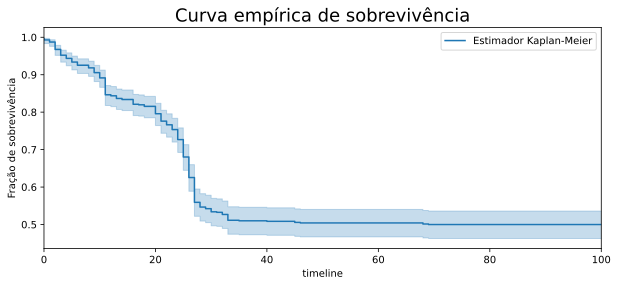

In [109]:
from lifelines import KaplanMeierFitter

import matplotlib.pyplot as plt 

import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format='svg'

## Example Data 
durations = list(df['Tempo_ate_tendencia'])
event_observed = list(df['Status'])

## create an kmf object
kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf.fit(durations, event_observed,label='Estimador Kaplan-Meier')

N, M = 10, 4
fig, ax = plt.subplots(figsize=(N, M))
plt.xlim(0, 100)

plt.title('Curva empírica de sobrevivência',fontsize=18)

plt.ylabel('Fração de sobrevivência')
plt.xlabel('Tempos de falha')

kmf.plot(ax=ax) ## ci_show is meant for Confidence interval, since our data set is too tiny,
# plt.savefig(ima+"Sobrevivencia_geral_base_amos.pdf", bbox_inches='tight',pad_inches=0.1)


### categories

In [48]:
# df.isnull().sum()
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 710 entries, 0 to 709
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype              
---  ------               --------------  -----              
 0   Id                   710 non-null    object             
 1   Vistas               710 non-null    float64            
 2   likes                705 non-null    float64            
 3   Comentarios          699 non-null    float64            
 4   C_id                 710 non-null    object             
 5   Data                 710 non-null    datetime64[ns, UTC]
 6   Título               276 non-null    object             
 7   C_Data               710 non-null    datetime64[ns, UTC]
 8   C_Titulo             710 non-null    object             
 9   Pais                 666 non-null    object             
 10  C_Vistas             710 non-null    int64              
 11  Subscriptores        710 non-null    float64            
 12  No Videos            7

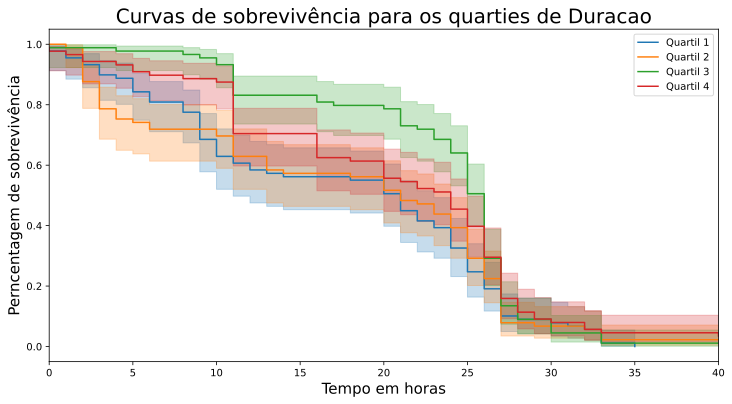

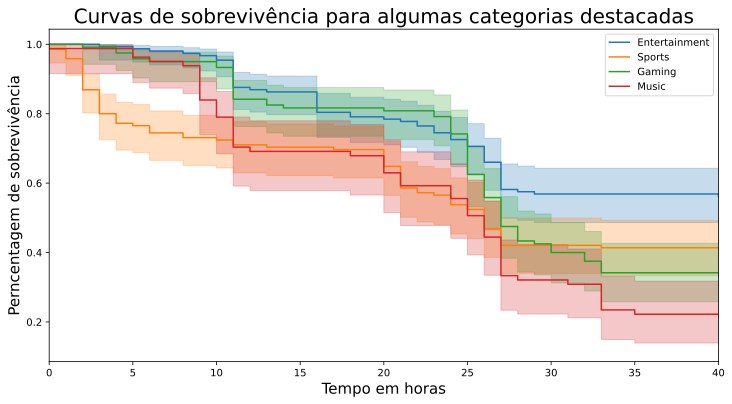

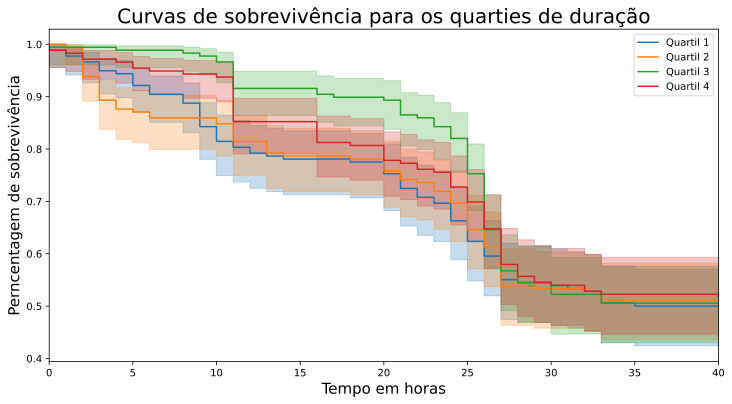

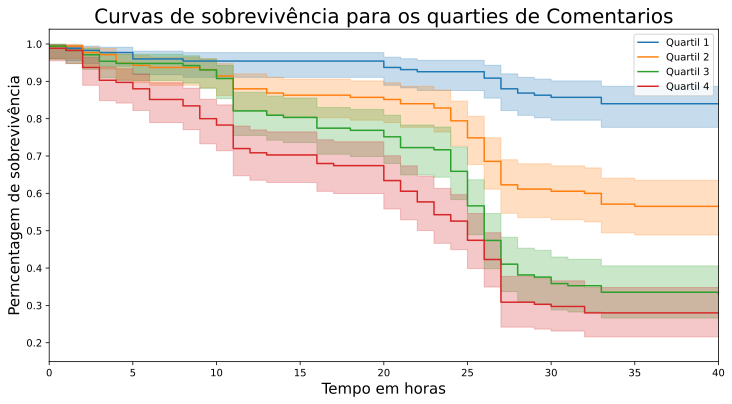

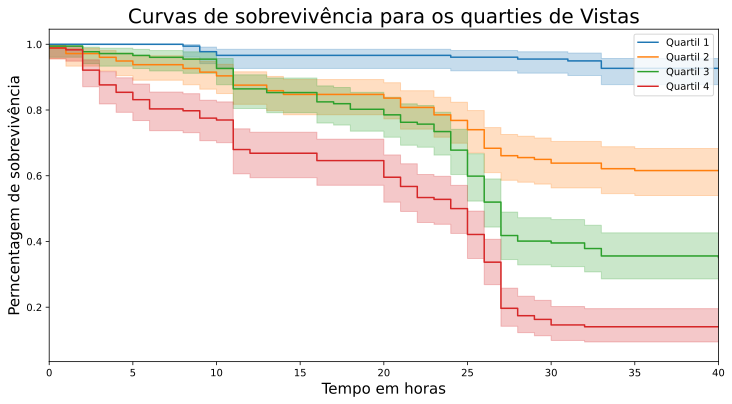

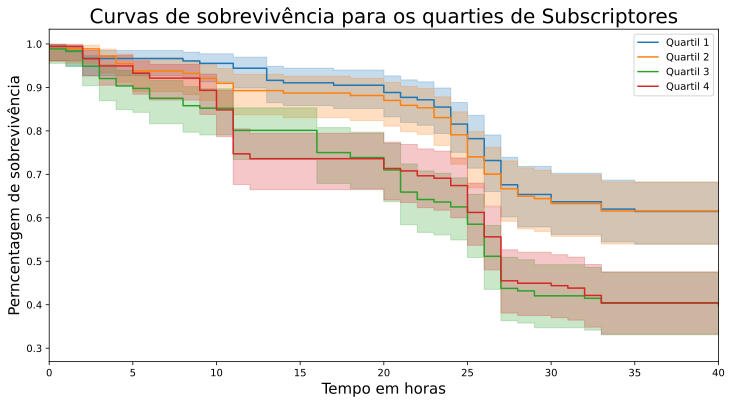

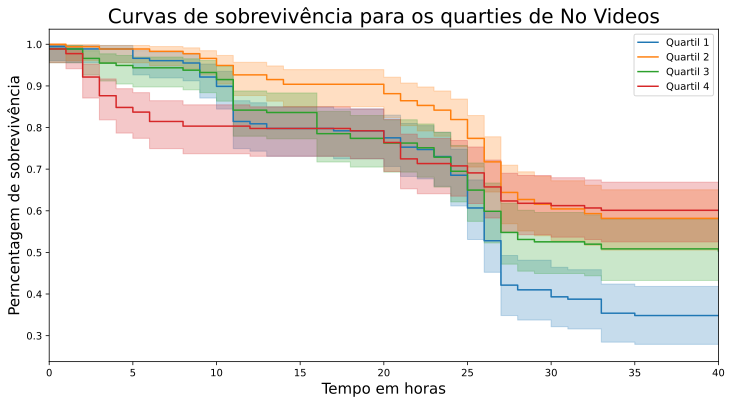

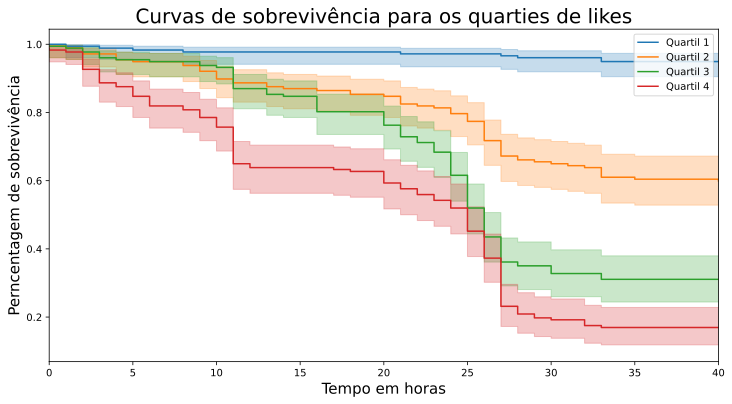

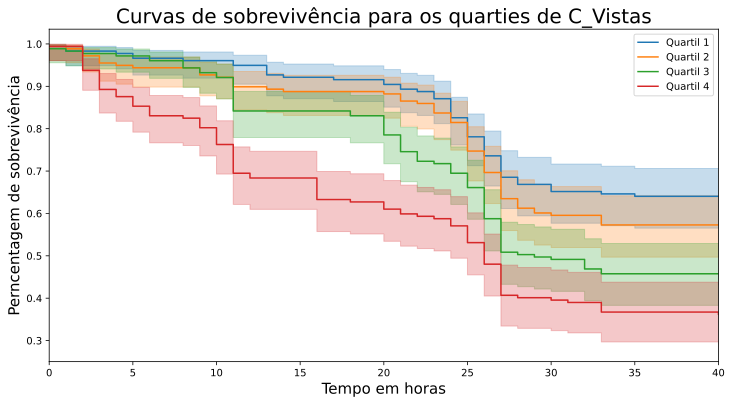

In [21]:
#Diferentes comparações de Kaplan Meier para os vídeos com e sem tendencia

categories=[i for i in df['Categoria'].value_counts().keys()]
len(categories)


from lifelines import KaplanMeierFitter

##################################
#################################
########  Sem Censuras #########
#########################
###########################

kmf = KaplanMeierFitter() 
T = amostras_com_ten2['Tempo_ate_tendencia']     ## time to event
E = amostras_com_ten2['Status']      ## event occurred or censored


# var="Vistas"
amostras_com_ten2['Q_'+var]=pd.qcut(amostras_com_ten[var], 
                             q = 4, labels = False)



kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_'+var]        ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de '+var, fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_"+var+"_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  Categorias #########
#########################
###########################

kmf = KaplanMeierFitter() 


T = df['Tempo_ate_tendencia']     ## time to event
E = df['Status']      ## event occurred or censored


groups = df['Categoria']             ## Create the cohorts from the 'Contract' column

ix0 = (groups == categories[0])   ## Cohort 0  Entertainment
ix1 = (groups == categories[1])   ## Cohort 1  Sports
ix2 = (groups == categories[2])         ## Cohort 2  Gaming
ix3 = (groups == categories[3])         ## Cohort 3  Music
ix4 = (groups == categories[4])   ## Cohort 0  People & Blogs
ix5 = (groups == categories[5])   ## Cohort 1  News & Politics
ix6 = (groups == categories[6])         ## Cohort 2  Autos & Vehicles 
ix7 = (groups == categories[7])         ## Cohort 3  Film & Animation
ix8 = (groups == categories[8])   ## Cohort 0  Education
ix9 = (groups == categories[9])   ## Cohort 1  Science & Technology
ix10 = (groups == categories[10])         ## Cohort 2  Comedy
ix11 = (groups == categories[11])      # Howto & Style
ix12 = (groups == categories[12])         ## Cohort 2
ix13 = (groups == categories[13])    # education

# plt.figu

plt.figure(figsize=(12,6))

kmf.fit(T[ix0], E[ix0], label=categories[0])    ## fit the cohort 1 data
ax = kmf.plot(ci_show=True)

kmf.fit(T[ix1], E[ix1], label=categories[1])    ## fit the cohort 1 data
ax = kmf.plot(ci_show=True)


kmf.fit(T[ix2], E[ix2], label=categories[2])         ## fit the cohort 2 data
ax1 = kmf.plot(ax=ax,ci_show=True)


kmf.fit(T[ix3], E[ix3], label=categories[3])        ## fit the cohort 3 data
kmf.plot(ci_show=True)                                 ## Plot the KM curve for three cohort on same x and y axis

# kmf.fit(T[ix4], E[ix4], label=categories[4])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix5], E[ix5], label=categories[5])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix6], E[ix6], label=categories[6])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)

# kmf.fit(T[ix7], E[ix7], label=categories[7])    ## 29
# kmf.plot(ci_show=True)


# kmf.fit(T[ix10], E[ix10], label=categories[10])    ## Autos y vehiculos
# kmf.plot(ci_show=False)


# kmf.fit(T[ix11], E[ix11], label=categories[11])    ## How To Style
# kmf.plot(ci_show=False)

# kmf.fit(T[ix12], E[ix12], label=categories[12])    ## Pets and animals
# kmf.plot(ci_show=False)


# kmf.fit(T[ix13], E[ix13], label=categories[13])    ## Education
# kmf.plot(ci_show=False)


plt.title('Curvas de sobrevivência para algumas categorias destacadas',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_Categorias.pdf", bbox_inches='tight',pad_inches=0.1)

plt.xlim([0, 40])
plt.show()

##################################
#################################
########  DURACOES #########
#########################
###########################


df['Q_Duracao']=pd.qcut(df['Duracao'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_Duracao']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de duração',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_Duracao.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()



##################################
#################################
########  Cometarios #########
###########################
###########################

df['Q_Comentarios']=pd.qcut(df['Comentarios'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_Comentarios']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Comentarios',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_Comentarios.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  Vistas #########
###########################
###########################

df['Q_Vistas']=pd.qcut(df['Vistas'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_Vistas']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Vistas',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_Vistas.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  Subpscritores #########
###########################
###########################

df['Q_Subscriptores']=pd.qcut(df['Subscriptores'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_Subscriptores']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)


# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Subscriptores',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_Subscriptores.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  No Videos #########
###########################
###########################


df['Q_No Videos']=pd.qcut(df['No Videos'], 
                             q = 4, labels = False)


kmf = KaplanMeierFitter() 



groups = df['Q_No Videos']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de No Videos',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_NoVideos.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()



##################################
#################################
########  likes #########
###########################
###########################

df['Q_likes']=pd.qcut(df['likes'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_likes']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de likes',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_likes.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  C_Vistas #########
###########################
###########################

df['Q_C_Vistas']=pd.qcut(df['C_Vistas'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = df['Q_C_Vistas']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)


kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de C_Vistas',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+var+"_C_Vistas.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


In [163]:
df.columns

Index(['Id', 'Vistas', 'likes', 'Comentarios', 'C_id', 'Data', 'Título',
       'C_Data', 'C_Titulo', 'Pais', 'C_Vistas', 'Subscriptores', 'No Videos',
       'Titulo', 'Categoria', 'Duracao', 'Tempo_ate_tendencia', 'Status',
       'Q_Duracao', 'Q_Comentarios', 'Q_Vistas', 'Q_Subscriptores',
       'Q_No Videos', 'Q_likes'],
      dtype='object')

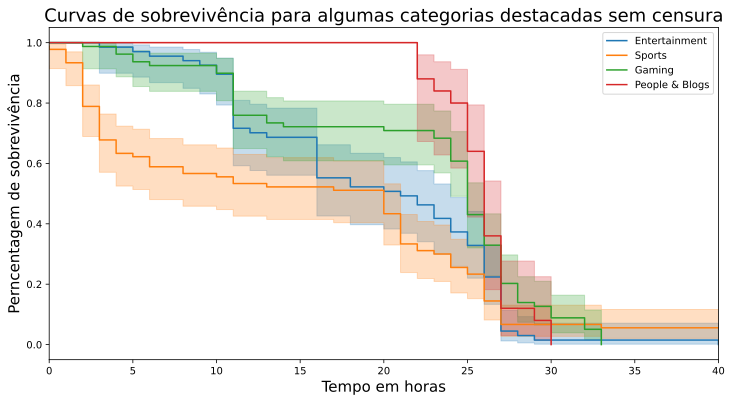

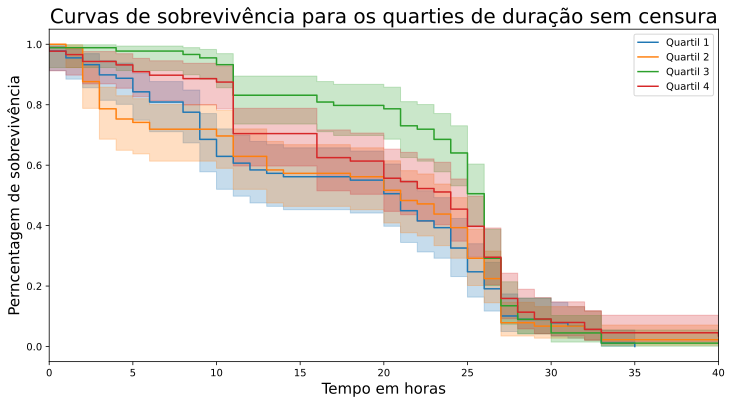

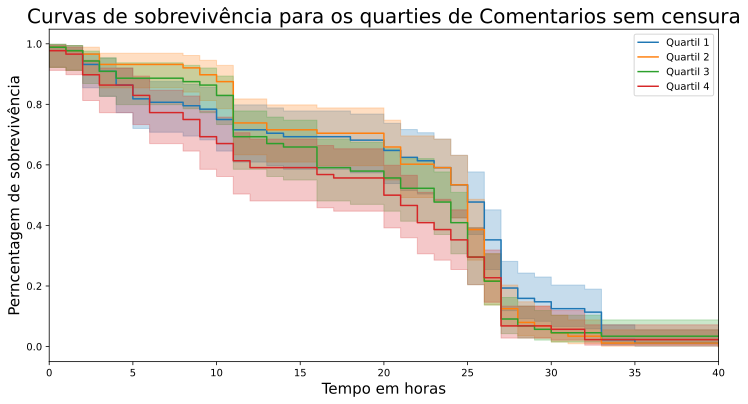

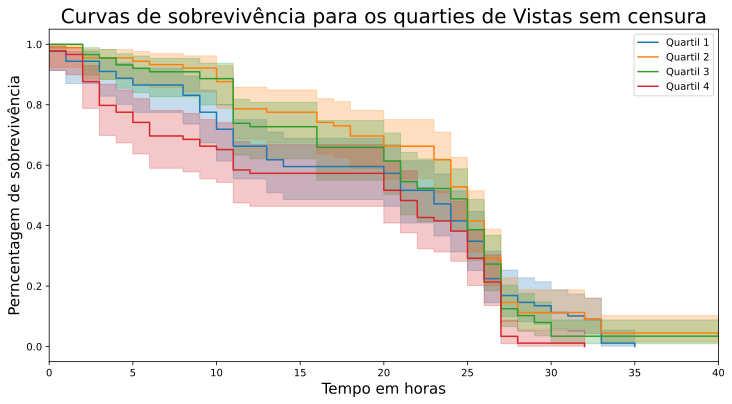

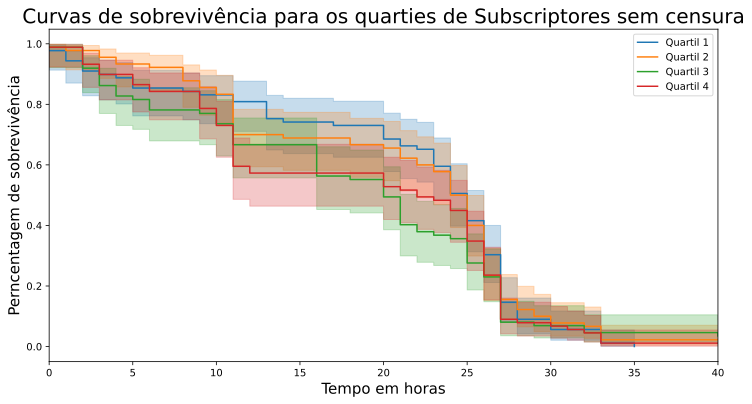

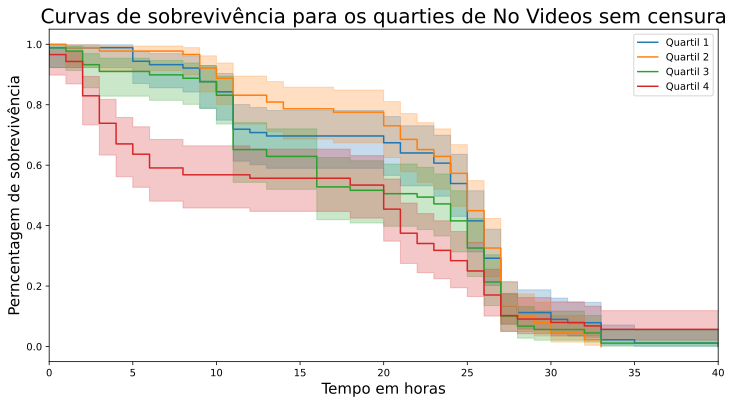

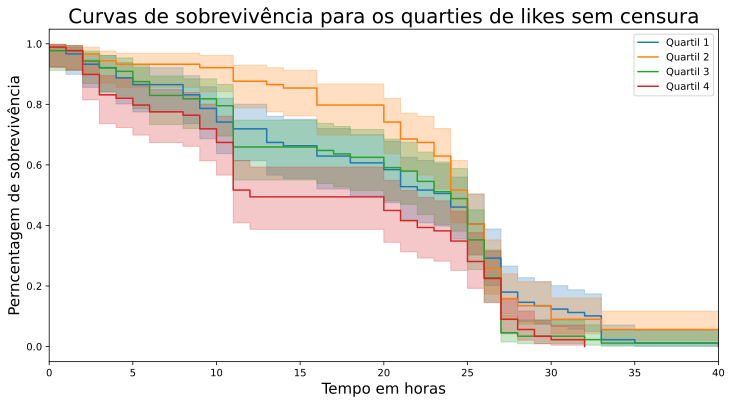

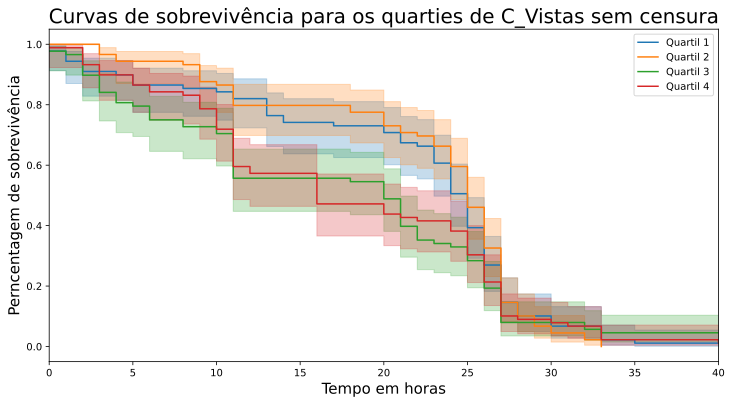

In [9]:

##################################
#################################
########  Categorias #########
#########################
###########################

kmf = KaplanMeierFitter() 


T = amostras_com_ten2['Tempo_ate_tendencia']     ## time to event
E = amostras_com_ten2['Status']      ## event occurred or censored


groups = amostras_com_ten2['Categoria']             ## Create the cohorts from the 'Contract' column

ix0 = (groups == categories[0])   ## Cohort 0  Entertainment
ix1 = (groups == categories[1])   ## Cohort 1  Sports
ix2 = (groups == categories[2])         ## Cohort 2  Gaming
ix3 = (groups == categories[3])         ## Cohort 3  Music
ix4 = (groups == categories[4])   ## Cohort 0  People & Blogs
ix5 = (groups == categories[5])   ## Cohort 1  News & Politics
ix6 = (groups == categories[6])         ## Cohort 2  Autos & Vehicles 
ix7 = (groups == categories[7])         ## Cohort 3  Film & Animation
ix8 = (groups == categories[8])   ## Cohort 0  Education
ix9 = (groups == categories[9])   ## Cohort 1  Science & Technology
ix10 = (groups == categories[10])         ## Cohort 2  Comedy
ix11 = (groups == categories[11])      # Howto & Style
ix12 = (groups == categories[12])         ## Cohort 2
ix13 = (groups == categories[13])    # education

# plt.figu

plt.figure(figsize=(12,6))

kmf.fit(T[ix0], E[ix0], label=categories[0])    ## fit the cohort 1 data
ax = kmf.plot(ci_show=True)

kmf.fit(T[ix1], E[ix1], label=categories[1])    ## fit the cohort 1 data
ax = kmf.plot(ci_show=True)


kmf.fit(T[ix2], E[ix2], label=categories[2])         ## fit the cohort 2 data
ax1 = kmf.plot(ax=ax,ci_show=True)


kmf.fit(T[ix3], E[ix3], label=categories[3])        ## fit the cohort 3 data
kmf.plot(ci_show=True)                                 ## Plot the KM curve for three cohort on same x and y axis

# kmf.fit(T[ix4], E[ix4], label=categories[4])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix5], E[ix5], label=categories[5])    ## fit the cohort 1 data
# ax = kmf.plot(ci_show=False)

# kmf.fit(T[ix6], E[ix6], label=categories[6])    ## fit the cohort 1 data
# kmf.plot(ci_show=False)

# kmf.fit(T[ix7], E[ix7], label=categories[7])    ## 29
# kmf.plot(ci_show=True)


# kmf.fit(T[ix10], E[ix10], label=categories[10])    ## Autos y vehiculos
# kmf.plot(ci_show=False)


# kmf.fit(T[ix11], E[ix11], label=categories[11])    ## How To Style
# kmf.plot(ci_show=False)

# kmf.fit(T[ix12], E[ix12], label=categories[12])    ## Pets and animals
# kmf.plot(ci_show=False)


# kmf.fit(T[ix13], E[ix13], label=categories[13])    ## Education
# kmf.plot(ci_show=False)


plt.title('Curvas de sobrevivência para algumas categorias destacadas sem censura',fontsize=18)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"Categorias"+"SC.pdf", bbox_inches='tight',pad_inches=0.1)

plt.xlim([0, 40])
plt.show()

##################################
#################################
########  DURACOES #########
#########################
###########################


amostras_com_ten2['Q_Duracao']=pd.qcut(amostras_com_ten2['Duracao'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_Duracao']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de duração sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"Duracoes"+"SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()



##################################
#################################
########  Comentarios #########
###########################
###########################

amostras_com_ten2['Q_Comentarios']=pd.qcut(amostras_com_ten2['Comentarios'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_Comentarios']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Comentarios sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"Comentarios_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  Vistas #########
###########################
###########################

amostras_com_ten2['Q_Vistas']=pd.qcut(amostras_com_ten2['Vistas'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_Vistas']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Vistas sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"Vistas_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  Supscriptores #########
###########################
###########################

amostras_com_ten2['Q_Subscriptores']=pd.qcut(amostras_com_ten2['Subscriptores'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_Subscriptores']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de Subscriptores sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"Subscriptores_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  No Videos #########
###########################
###########################

amostras_com_ten2['Q_No Videos']=pd.qcut(amostras_com_ten2['No Videos'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_No Videos']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de No Videos sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"NoVideos_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()



##################################
#################################
########  likes #########
###########################
###########################

amostras_com_ten2['Q_likes']=pd.qcut(amostras_com_ten2['likes'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_likes']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)
kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax1 = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax1 = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de likes sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"likes_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()


##################################
#################################
########  C_Vistas #########
###########################
###########################

amostras_com_ten2['Q_C_Vistas']=pd.qcut(amostras_com_ten2['C_Vistas'], 
                             q = 4, labels = False)

kmf = KaplanMeierFitter() 



groups = amostras_com_ten2['Q_C_Vistas']            ## Create the cohorts by the  'Q_duracao' column

ix0 = (groups == 0)   ## Cohort 0
ix1 = (groups == 1)   ## Cohort 1
ix2 = (groups == 2)   ## Cohort 2
ix3 = (groups == 3)

# plt.figu


plt.figure(figsize=(12,6))
plt.xlim(0, 40)


kmf.fit(T[ix0], E[ix0], label= 'Quartil 1')    ## fit the cohort 1 data
ax = kmf.plot()

kmf.fit(T[ix1], E[ix1], label= 'Quartil 2')    ## fit the cohort 1 data
ax = kmf.plot()


kmf.fit(T[ix2], E[ix2], label= 'Quartil 3')         ## fit the cohort 2 data
ax = kmf.plot()

kmf.fit(T[ix3], E[ix3], label= 'Quartil 4')         ## fit the cohort 2 data
ax = kmf.plot()

plt.title('Curvas de sobrevivência para os quarties de C_Vistas sem censura',fontsize=20)
plt.ylabel('Perncentagem de sobrevivência',fontsize=15)
plt.xlabel('Tempo em horas',fontsize=15)

ax.legend(loc='upper right')
plt.savefig(ima+"C_Vistas_SC.pdf", bbox_inches='tight',pad_inches=0.1)
plt.show()
